# Spotify Hit Classification

In this notebook I will attempt to build a classifier that determines how likely a song is to become a hit. The data comes from "The Spotify Hit Predictor Dataset (1960-2019)" on Kaggle.

## Data Description

- **Track**: The Name of the track.

- **Artist**: The Name of the Artist.

- **URI**: The resource identifier for the track.

- **Danceability**: Danceability describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable. 

- **Energy**: Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual features contributing to this attribute include dynamic range, perceived loudness, timbre, onset rate, and general entropy. 

- **Key**: The estimated overall key of the track. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C?/D?, 2 = D, and so on. If no key was detected, the value is -1.

- **Loudness**: The overall loudness of a track in decibels (dB). Loudness values are averaged across the entire track and are useful for comparing relative loudness of tracks. Loudness is the quality of a sound that is the primary psychological correlate of physical strength (amplitude). Values typical range between -60 and 0 db. 

- **Mode**: Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.

- **Speechiness**: Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks. 

- **Acousticness**: A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic. The distribution of values for this feature look like this:

- **Instrumentalness**: Predicts whether a track contains no vocals. “Ooh” and “aah” sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly “vocal”. The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is higher as the value approaches 1.0. The distribution of values for this feature look like this:

- **Liveness**: Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live.

- **Valence**: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry).

- **Tempo**: The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration. 

- **Duration_Ms**:  The duration of the track in milliseconds.

- **TimeSignature**: An estimated overall time signature of a track. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure).

- **Chorus_Hit**: This the the author's best estimate of when the chorus would start for the track. Its the timestamp of the start of the third section of the track. This feature was extracted from the data received by the API call for Audio Analysis of that particular track.

- **Sections**: The number of sections the particular track has. This feature was extracted from the data received by the API call for Audio Analysis of that particular track.

- **Target**: The target variable for the track. It can be either '0' or '1'. '1' implies that this song has featured in the weekly list (Issued by Billboards) of Hot-100 tracks in that decade at least once and is therefore a 'hit'. '0' Implies that the track is a 'flop'.

      The author's condition of a track being 'flop' is as follows:

        - The track must not appear in the 'hit' list of that decade.
        - The track's artist must not appear in the 'hit' list of that decade.
        - The track must belong to a genre that could be considered non-mainstream and / or avant-garde. 
        - The track's genre must not have a song in the 'hit' list.
        - The track must have 'US' as one of its markets.

## Imports

In [21]:
import os
os.chdir(r"C:\Users\tom.dawson\Documents\Git Projects\SpotifyMusicData")
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from optbinning import OptimalBinning
import math
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.preprocessing import OrdinalEncoder
import statsmodels.api as sm
from statsmodels.discrete.discrete_model import Logit
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, recall_score, precision_score, accuracy_score, confusion_matrix

## Functions

In [2]:
def DistributionPlot(Df, PlotVar):
    '''
    Plots the distribution of a given variable in a dataframe
    '''
    Labels = [i for i in range(0, 100, 10)]
    
    BinSize = Df[PlotVar].describe().loc["std"] / 20
    
    fig = ff.create_distplot(
            hist_data = [Df[Df["Target"] == 0][PlotVar].values, Df[Df["Target"] == 1][PlotVar].values]
            , group_labels = [0, 1]
            , bin_size=BinSize
            , show_hist=True)
    
    fig.update_xaxes(
    zeroline = True
    , showgrid = True
    , title=PlotVar)


    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        , title="Distribution")


    fig.update_layout(
        title = dict(text=str(PlotVar) + " Distribution"
                     , font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 700
        , width = 1100
        , legend_title='Target')

    fig.show(renderer='png', height=700, width=1100)

In [3]:
def Scatter(Df, PlotVar, Hue, Y, Title):
    
    '''
    Produces a plot of data pulled from specified dataframe split by a certain binary population
    PlotVars defines the independent variable
    Hue defines the population for which to split the plots
    Y is the dependent variable
    Title is title of the plot
    '''

    fig = go.Figure()

    fig.add_trace(  
        go.Scatter(
            x = Df[Df[Hue] == 1][PlotVar]
            , y=Df[Df[Hue] == 1][Y]
            , legendgroup=Hue + " = 1"
            , name=Hue + " = 1"
            , mode='markers'
            , line=dict(color='red')
            , marker=dict(size=10, opacity=0.1)
            , showlegend= True))

    fig.add_trace(  
        go.Scatter(
            x = Df[Df[Hue] == 0][PlotVar]
            , y=Df[Df[Hue] == 0][Y]
            , legendgroup=Hue + " = 0"
            , name=Hue + " = 0"
            , mode='markers'
            , line=dict(color='blue')
            , marker=dict(size=10, opacity=0.1)
            , showlegend= True))

    fig.update_xaxes(
        zeroline = True
        , showgrid = True
        , title = PlotVar
        #, range = [0.95*np.min(Df[PlotVar]), 1.05*np.max(Df[PlotVar])]
    )

    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        #, range = [0.95*np.min(Df[Y]), 1.05*np.max(Df[Y])]
        , title = Y)
    
    
    fig.update_layout(
        title = dict(text=Title, font=dict(size=17)))

    fig.update_annotations(
        font = dict(size=14))
    
    fig.show(renderer="png", height=600, width=1000)

In [4]:
def Distribution(Df, Target, Variable):    
    Graph = pd.pivot_table(Df, index=Variable, columns=Target, values="Track", aggfunc=len)
    Graph1 = pd.pivot_table(Df, index=Variable, values=Target, aggfunc="mean").sort_values(by="Target", ascending=False)
    
    Graph = Graph.reindex(Graph1.index)


    fig = make_subplots(specs=[[{"secondary_y": True}]])


    fig.add_trace(
        go.Line(
            y=Graph1[Target]*100
            , x=[Col.title() if type(Col) == "str" else Col for Col in Graph1.index.values]
            , name=Target
            , showlegend= True)
        , secondary_y = True)


    fig.add_trace(
        go.Bar(
            y=Graph[0]
            , x=[Col.title() if type(Col) == "str" else Col for Col in Graph1.index.values]
            , name="Not"+str(Target)
            , showlegend= True)
        , secondary_y = False)

    fig.add_trace(
        go.Bar(
            y=Graph[1]
            , x=[Col.title() if type(Col) == "str" else Col for Col in Graph1.index.values]
            , name=Target
            , showlegend= True)
        , secondary_y = False)


    fig.update_xaxes(
        zeroline = True
        , showgrid = True
        , title = Variable
        , type="category")

    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        , title="Frequency"
        , secondary_y = False)

    fig.update_yaxes(
        zeroline=True
        , showgrid=False
        , title=Target
        , ticksuffix="%"
        , range=[0, 100]
        , secondary_y = True)


    fig.update_layout(
        title = dict(text= str(Variable) +" Distribution vs. " + str(Target), font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 600
        , width = 900
        , barmode='stack')


    fig.update_annotations(
    font = dict(color="Black", size=14))

    fig.show(renderer="png", width=900, height=600)

In [5]:
def BinVariable(Df, Target, Variable, BinOut, Trend = "auto_asc_desc"):
    Size = 0.01 #Picks minimum bin size
    
    OptB = OptimalBinning(name=Variable, dtype="numerical", solver="cp", max_n_prebins=100, monotonic_trend=Trend,
                          min_prebin_size=Size, time_limit=60)

    OptB.fit(Df[Variable], Df[Target])
    
    print(OptB.status)
    
    BinsValues = OptB.splits #Where the splits are
    BinningTable = OptB.binning_table
    Bins = BinningTable.build()
    Analysis = BinningTable.analysis() #Summary
    
    print(Analysis)

    BinOut[Variable] = BinsValues

    fig = make_subplots(specs=[[{"secondary_y": True}]])

    fig.add_trace(
        go.Bar(
            y=Bins["Non-event"][0:len(BinsValues)+1]
            , x=Bins["Bin"][0:len(BinsValues)+1]
            , name="Frequency " + str(Target) + " = 0"
            , showlegend= True)
        , secondary_y = False)

    fig.add_trace(
        go.Bar(
            y=Bins["Event"][0:len(BinsValues)+1]
            , x=Bins["Bin"][0:len(BinsValues)+1]
            , name="Frequency " + str(Target) + " = 1"
            , showlegend= True)
        , secondary_y = False)

    fig.add_trace(
        go.Line(
            y=Bins["Event rate"][0:len(BinsValues)+1]*100 #EventRate = IsNotGraduatedRate
            , x=Bins["Bin"][0:len(BinsValues)+1]
            , name=str(Target) + " Rate"
            , showlegend= True
            , connectgaps = True)
        , secondary_y = True)


    fig.update_xaxes(
        zeroline = True
        , showgrid = True
        , title = Variable
        , tickmode = 'linear')


    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        , title="Frequency"
        , secondary_y = False)

    fig.update_yaxes(
        zeroline=True
        , showgrid=False
        , title=str(Target) + " Rate"
        , ticksuffix="%"
        , range=[0, 100]
        , secondary_y = True)


    fig.update_layout(
        title = dict(text= Variable +" Distribution vs. " + str(Target), font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 600
        , width = 900
        , legend_title='Period'
        , barmode='stack')


    fig.update_annotations(
    font = dict(color="Black", size=14))

    fig.show(renderer="png", width=900, height=600)
    
    return BinOut

In [6]:
def Correlation(Df, PlotVars, Title): 
    
    '''
    Provides a correlation matrix heatmap for data pulled from a specified dataframe
    PlotVars define all features in question
    Title is title of the plot
    '''

    Correlations = Df[PlotVars].corr()

    fig = go.Figure()

    fig.add_trace(
        go.Heatmap(
            z=Correlations
            , x=Correlations.index
            , y=Correlations.index
            , zmax=1
            , zmin=-1
            , hoverongaps = False
            , colorscale=[(0, "blue"), (0.5, "white"), (1, "red")]))


    fig.update_layout(
        title = dict(text=Title, font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 1000
        , width = 1000
        , legend_title='Period')


    fig.update_annotations(
    font = dict(color="Black", size=14))

    fig.show()

In [7]:
def BinPlot(Df, Variable, Target, Proof = None):
    
    '''
    Plots the distribution of a chosen binned variable and the target.
    Option proof gives the option to verify a certain polynomial relationship assumption between the variable and the target
    '''
    
    Rate = pd.pivot_table(data=Df, columns=Variable, values = Target, aggfunc=np.mean).transpose()
    Count = pd.pivot_table(data=Df, columns=Variable, values = Target, aggfunc="count").transpose()
    
    print(Rate)
    print(Count)
    
    #If looking for a proof of polynomial relationship then fit logit model to target
    if Proof != None:
        #If looking for squared polynomial proof then define squared features
        if Variable in SquareVariables:
            Y = Rate[Target]
            X = np.asarray([i for i in Rate.index.values])
            X = np.vstack((X, [i**2 for i in Rate.index.values])).T

            X = sm.add_constant(X)
            Mod = sm.Logit(Y, X.astype(float))
            Mod = Mod.fit()

            Predictions = Mod.predict(X)
            
        else:
            #If looking for cubed polynomial proof then define cubed features
            Y = Rate[Target]
            X = np.asarray([i for i in Rate.index.values])
            X = np.vstack((X, [i**2 for i in Rate.index.values]))
            X = np.vstack((X, [i**3 for i in Rate.index.values])).T

            X = sm.add_constant(X)
            Mod = sm.Logit(Y, X.astype(float))
            Mod = Mod.fit()

            Predictions = Mod.predict(X) 
    
    #Plot
    fig = make_subplots(specs=[[{"secondary_y": True}]])

    fig.add_trace(
        go.Bar(
            y=Count[Target]
            , x=Count.index.values
            , name="Frequency"
            , showlegend= True)
        , secondary_y = False)
    
    fig.add_trace(
        go.Line(
            y=Rate[Target]*100
            , x=Rate.index.values
            , name=Target
            , showlegend= True
            , connectgaps = True)
        , secondary_y = True)
    
    #If proof then plot Logit's predictions
    if Proof != None:
        fig.add_trace(
            go.Line(
                y=Predictions*100
                , x=[i for i in Rate.index.values]
                , name="Predictions"
                , showlegend= True
                , connectgaps = True)
            , secondary_y = True)

    fig.update_xaxes(
        zeroline = True
        , showgrid = True
        , title = Variable)

    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        , title="Frequency"
        , secondary_y = False)

    fig.update_yaxes(
        zeroline=True
        , showgrid=False
        , title=Target
        , ticksuffix="%"
        , range=[0, 100]
        , secondary_y = True)


    fig.update_layout(
        title = dict(text= Variable +" Distribution vs. " + Target, font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 600
        , width = 900
        , legend_title='Period'
        , barmode='stack')


    fig.update_annotations(
    font = dict(color="Black", size=14))

    fig.show(renderer="png", width=900, height=600)

In [98]:
def BarPlot(DataFrame, Title):
    
    fig = go.Figure()
    
    for Column in DataFrame.columns.values:
        
        fig.add_trace(
            go.Bar(
                y=DataFrame[Column]
                , x=DataFrame.columns.values
                , name=str(Column)
                , showlegend= True))


    fig.update_xaxes(
        zeroline = True
        , showgrid = True
        , title = "Features"
        , showticklabels=False)

    fig.update_yaxes(
        zeroline=True
        , showgrid=True
        , title="Importance")


    fig.update_layout(
        title = dict(text= Title, font=dict(color="Black", size=20))
        , font = dict(color="Black", size=10)
        , height = 600
        , width = 900)


    fig.update_annotations(
    font = dict(color="Black", size=14))

    fig.show(renderer="png", width=900, height=600)

## Data Processing~

In [8]:
#Misc
Csv = ["dataset-of-60s", "dataset-of-70s", "dataset-of-80s", "dataset-of-90s", "dataset-of-00s", "dataset-of-10s"] 
Data = pd.DataFrame()

#Combine all datasets together and add decade column to see changes over time
for Set in Csv:
    Temp = pd.read_csv(f"DataSets\{Set}.csv")
    Temp["decade"] = [Set.split("-")[-1].replace("s",'')]*len(Temp)

    Data = Data.append(Temp)
    
#Standardise column names to uppercase first letter
for Column in Data.columns.values:
    Data[str(Column).title()] = Data[Column]
    del Data[Column]
    
Data["LowEnergy"] = Data["Energy"].apply(lambda x: 1 if x <= 0.2 else 0)
Data["Acoustic"] = Data["Acousticness"].apply(lambda x: 1 if x >= 0.8 else 0)
Data["FourFour"] = Data["Time_Signature"].apply(lambda x: 1 if x == 4 else 0)
    
    
ContinuousVars = ['Danceability', 'Energy', 'Loudness', 'Speechiness',
                   'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
                   'Duration_Ms', 'Chorus_Hit', 'Sections']

DiscreteVars = ["Time_Signature", "Mode", "Key", "Acoustic", "FourFour", "LowEnergy"]

# Split to train test
Data["Population"] = np.random.randint(1, 100, len(Data))
Data["Population"] = Data["Population"].apply(lambda x: "Train" if x <= 80 else "Test")

Train = Data.copy()
Test = Data.copy()
Train = Train[(Train["Population"] == "Train")]
Test = Test[(Test["Population"] == "Test")]

In [9]:
Train.columns.values

array(['Track', 'Artist', 'Uri', 'Danceability', 'Energy', 'Key',
       'Loudness', 'Mode', 'Speechiness', 'Acousticness',
       'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Duration_Ms',
       'Time_Signature', 'Chorus_Hit', 'Sections', 'Target', 'Decade',
       'LowEnergy', 'Acoustic', 'FourFour', 'Population'], dtype=object)

## EDA

In [10]:
Train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33203 entries, 0 to 6397
Data columns (total 24 columns):
Track               33203 non-null object
Artist              33203 non-null object
Uri                 33203 non-null object
Danceability        33203 non-null float64
Energy              33203 non-null float64
Key                 33203 non-null int64
Loudness            33203 non-null float64
Mode                33203 non-null int64
Speechiness         33203 non-null float64
Acousticness        33203 non-null float64
Instrumentalness    33203 non-null float64
Liveness            33203 non-null float64
Valence             33203 non-null float64
Tempo               33203 non-null float64
Duration_Ms         33203 non-null int64
Time_Signature      33203 non-null int64
Chorus_Hit          33203 non-null float64
Sections            33203 non-null int64
Target              33203 non-null int64
Decade              33203 non-null object
LowEnergy           33203 non-null int64
Acousti

In [11]:
Train.describe()

,Danceability,Energy,Key,Loudness,Mode,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_Ms,Time_Signature,Chorus_Hit,Sections,Target,LowEnergy,Acoustic,FourFour
count,33203.000000,33203.000000,33203.000000,33203.000000,33203.000000,33203.000000,33203.000000,33203.000000,33203.000000,33203.000000,33203.000000,3.320300e+04,33203.000000,33203.000000,33203.000000,33203.000000,33203.000000,33203.000000,33203.000000
mean,0.539828,0.580063,5.219318,-10.217388,0.693883,0.073058,0.364072,0.155221,0.202128,0.543278,119.319904,2.351017e+05,3.893895,40.058283,10.486040,0.499774,0.090052,0.166852,0.883113
std,0.177771,0.252546,3.539135,5.320260,0.460886,0.086568,0.339125,0.304585,0.173372,0.266985,29.087992,1.210839e+05,0.422872,18.894537,4.921596,0.500007,0.286261,0.372850,0.321290
min,0.000000,0.000251,0.000000,-49.253000,0.000000,0.000000,0.000000,0.000000,0.013000,0.000000,0.000000,1.516800e+04,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.421000,0.397000,2.000000,-12.790500,0.000000,0.033700,0.039100,0.000000,0.094000,0.330000,97.406500,1.727400e+05,4.000000,27.590680,8.000000,0.000000,0.000000,0.000000,1.000000
50%,0.552000,0.602000,5.000000,-9.256000,1.000000,0.043400,0.257000,0.000117,0.132000,0.559000,117.568000,2.179600e+05,4.000000,35.860670,10.000000,0.000000,0.000000,0.000000,1.000000
75%,0.669000,0.789000,8.000000,-6.368500,1.000000,0.070000,0.676000,0.060950,0.262000,0.768000,136.234000,2.671305e+05,4.000000,47.578020,12.000000,1.000000,0.000000,0.000000,1.000000
max,0.988000,1.000000,11.000000,3.744000,1.000000,0.960000,0.996000,0.999000,0.999000,0.993000,241.009000,4.170227e+06,5.000000,433.182000,169.000000,1.000000,1.000000,1.000000,1.000000


## Distributions

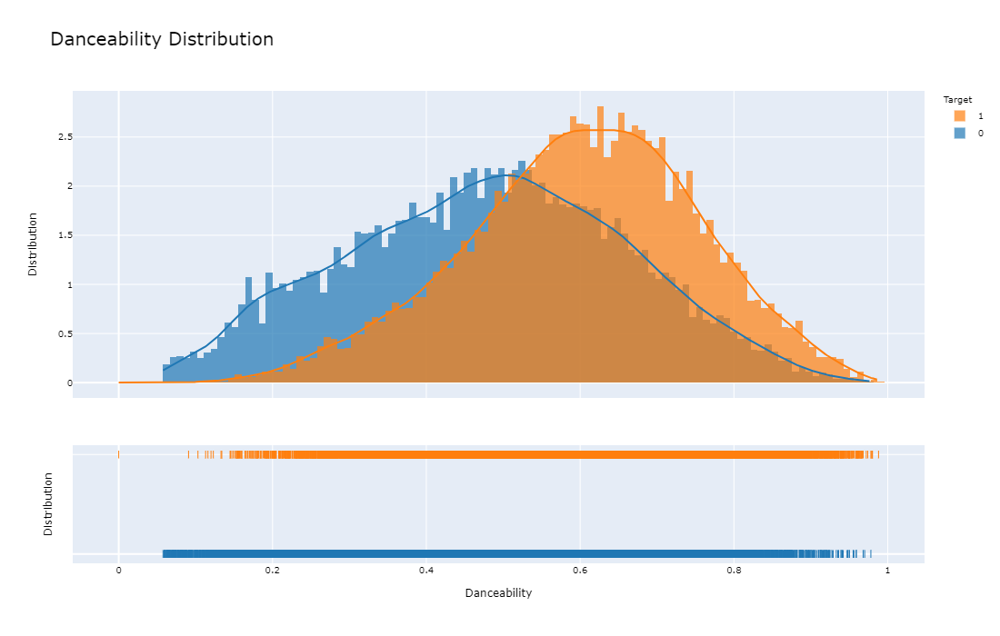

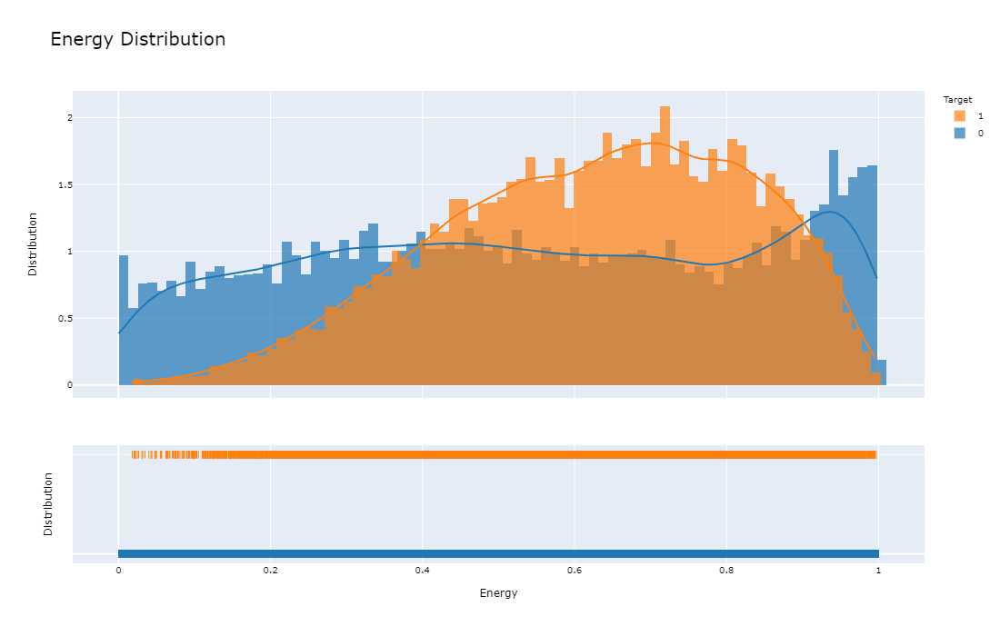

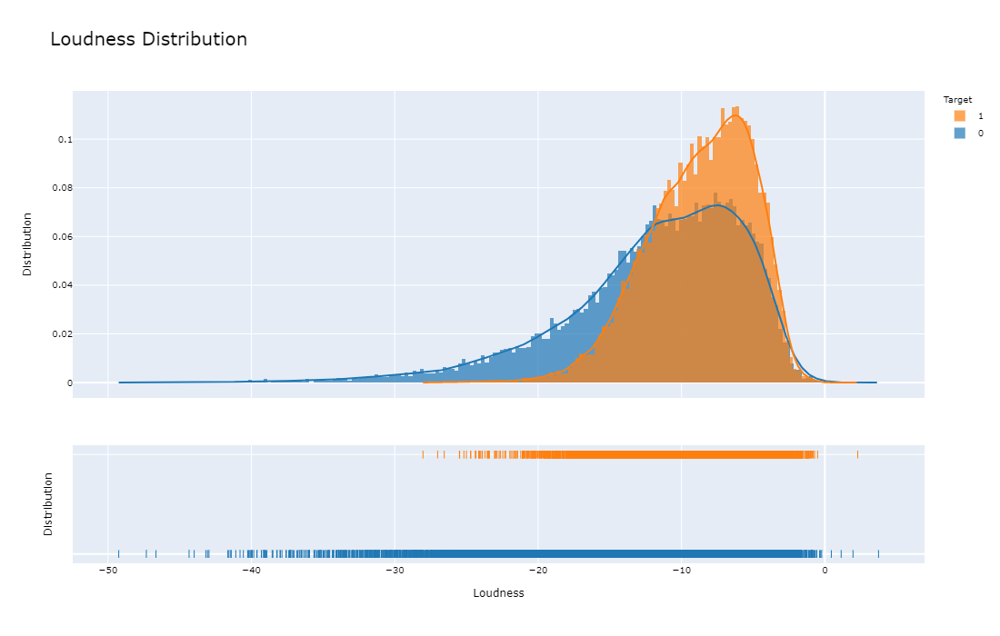

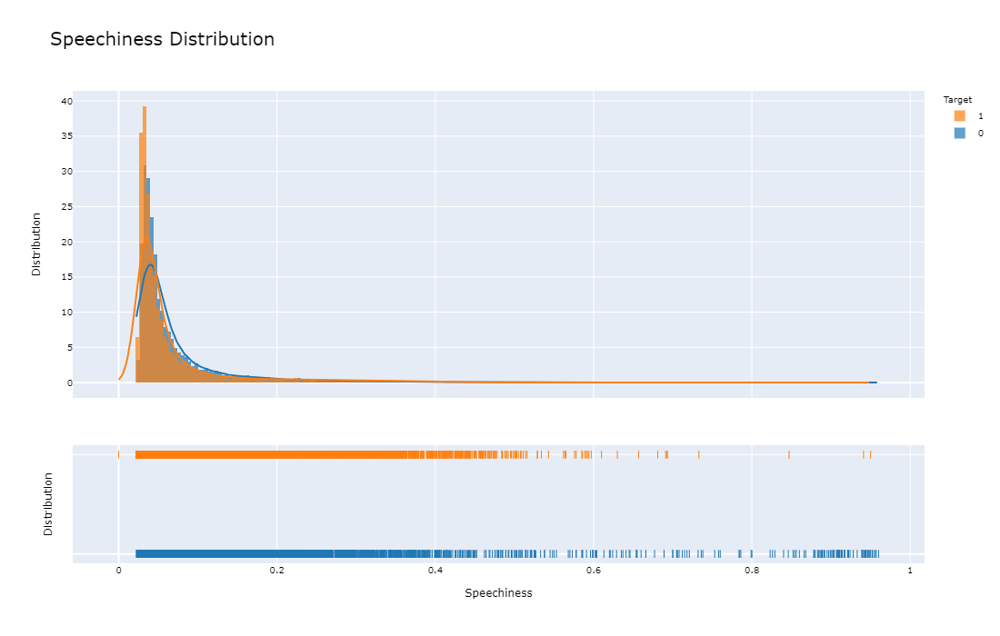

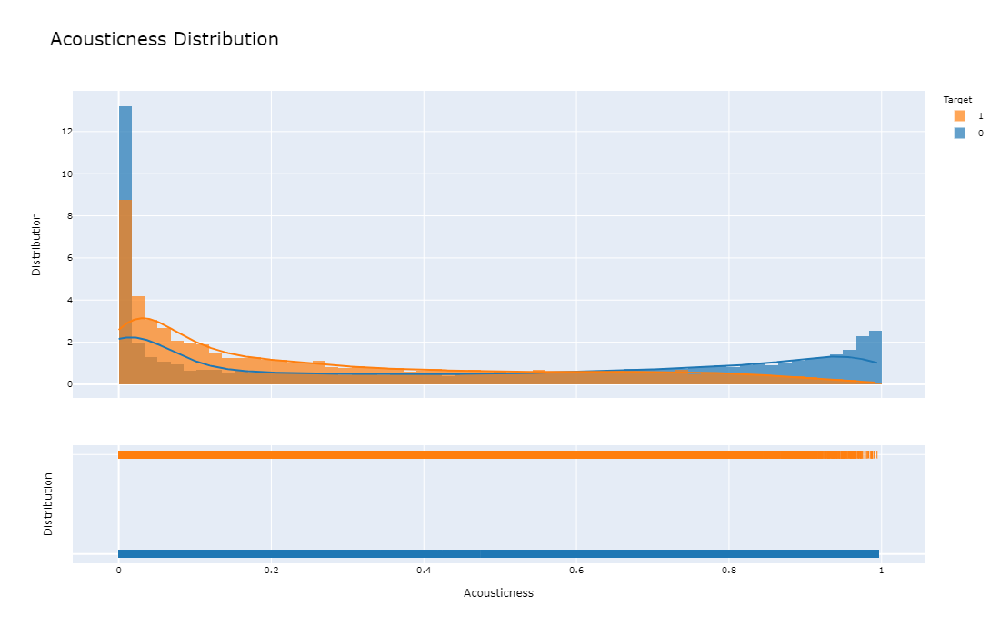

...

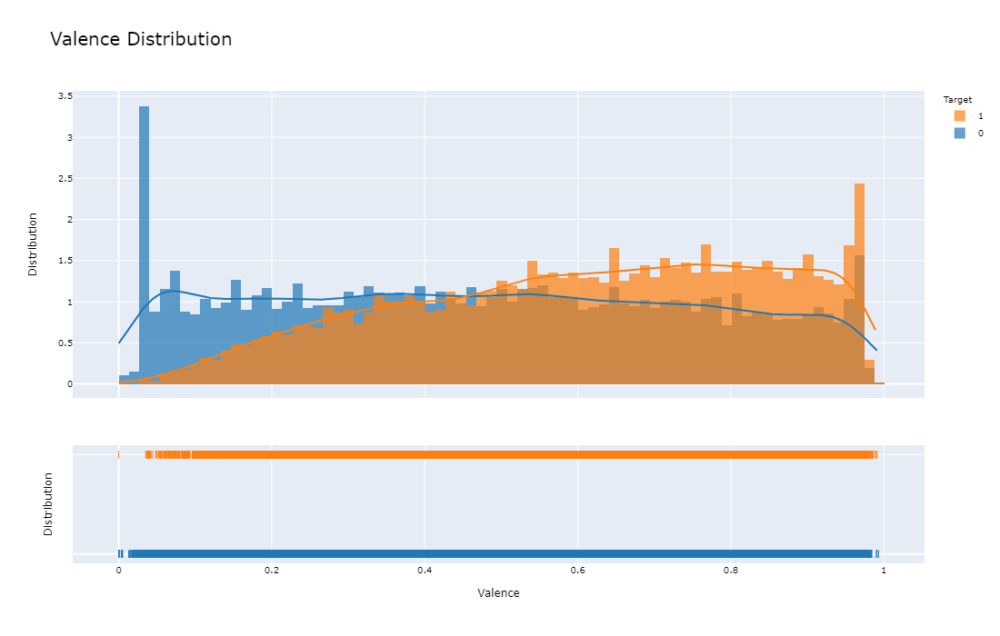

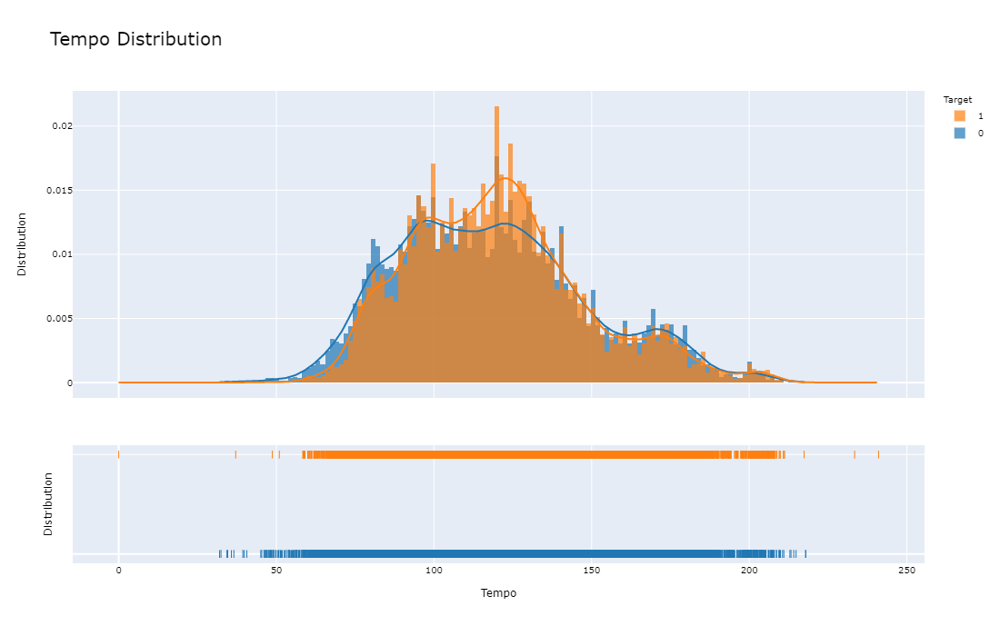

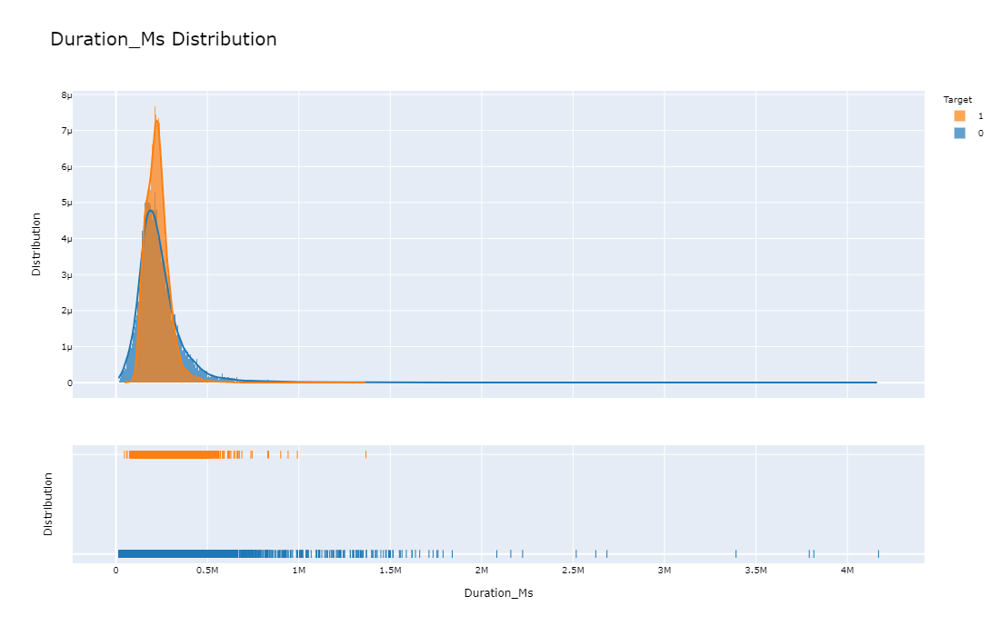

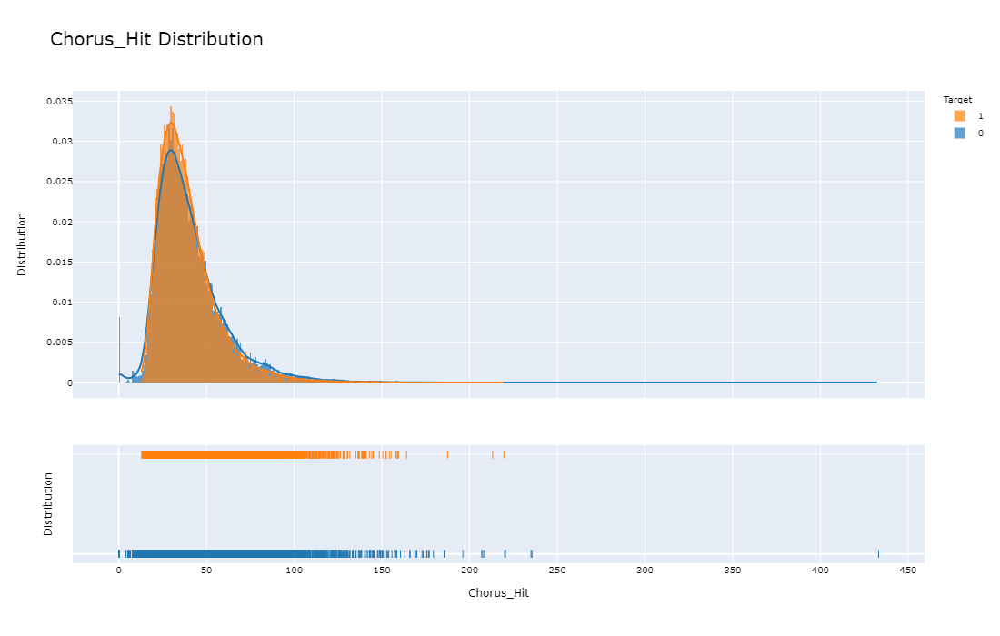

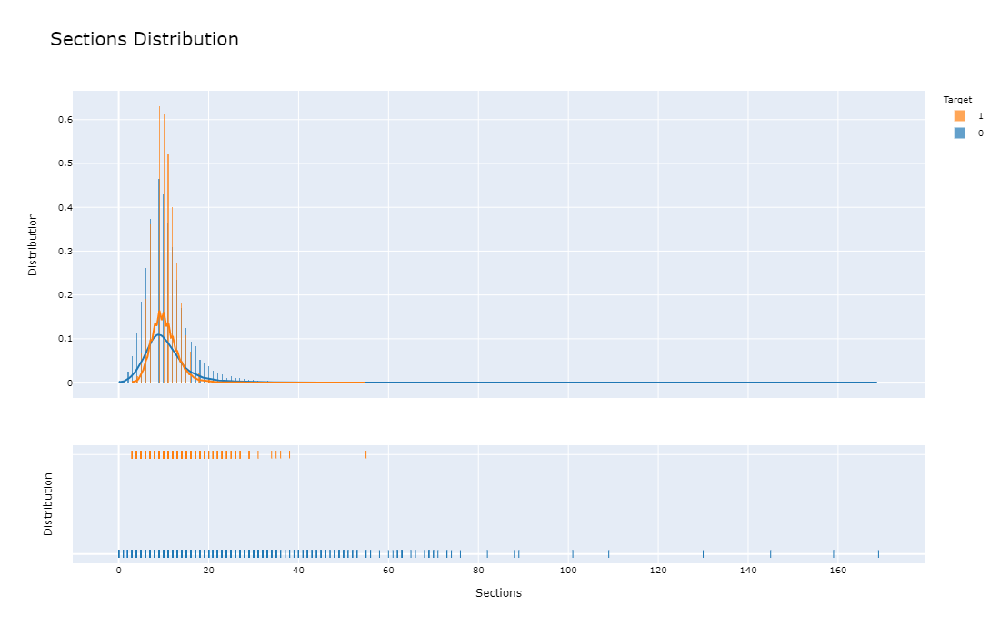

In [12]:
#More Danceable = More likely to be a hit
#More Energy = More likely to be a hit, extreme energy means less likely (Perhaps upbeat pop vs. dance)
#Louder = More likely to be a hit - Traditionally, louder mixes are sought after in the industry
#More Speechy = Less likely to be a hit - Some may not actually be songs
#More Acoustic = Less Likely to be a hit - Test relationship with other vars
#More Instrumental/Less Wordy Songs = Less likely to be a hit
#Liveness is fairly even across Hit vs. No hit
#More Valence = Hit, People want to listen to happier songs, most of the time
#Mid-High tempo implies more likely to be a Hit
#Clear sweet spot for duration - Definitely makes sense listener attention span, radio conventions etc.

for Var in ContinuousVars:
    DistributionPlot(Train, Var)

## Testing combined variable impact on Target

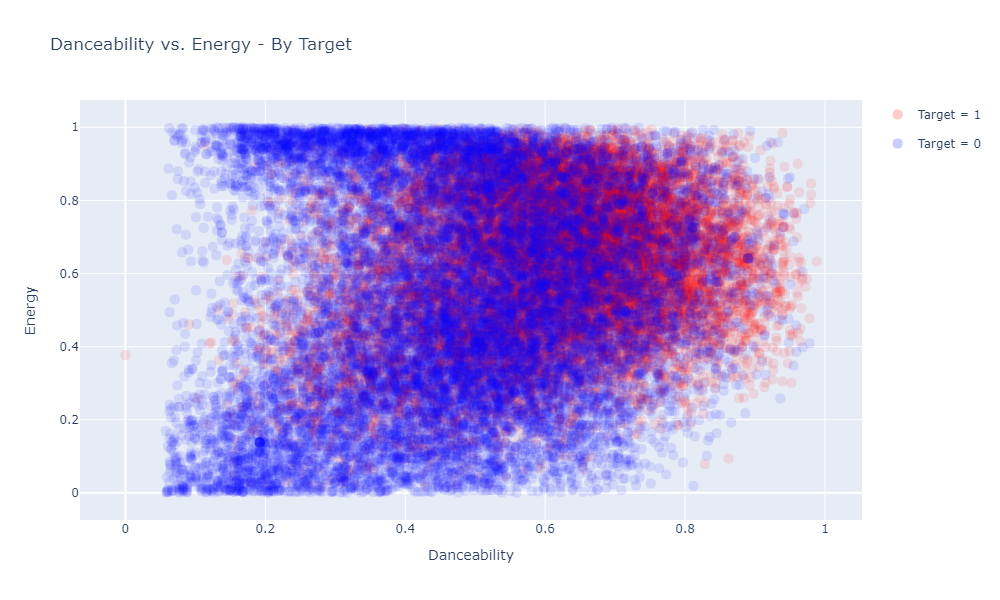

In [13]:
#Songs that become hits tend to be more danceable and have higher energy.
#Danceability and Energy possibly correlated?
#Danceability definitely correlates well with the target.
#High Energy but undanceable songs less likely to be a hit, maybe particular Rock/Metal genres?
Scatter(Train, "Danceability", "Target", "Energy", "Danceability vs. Energy - By Target")

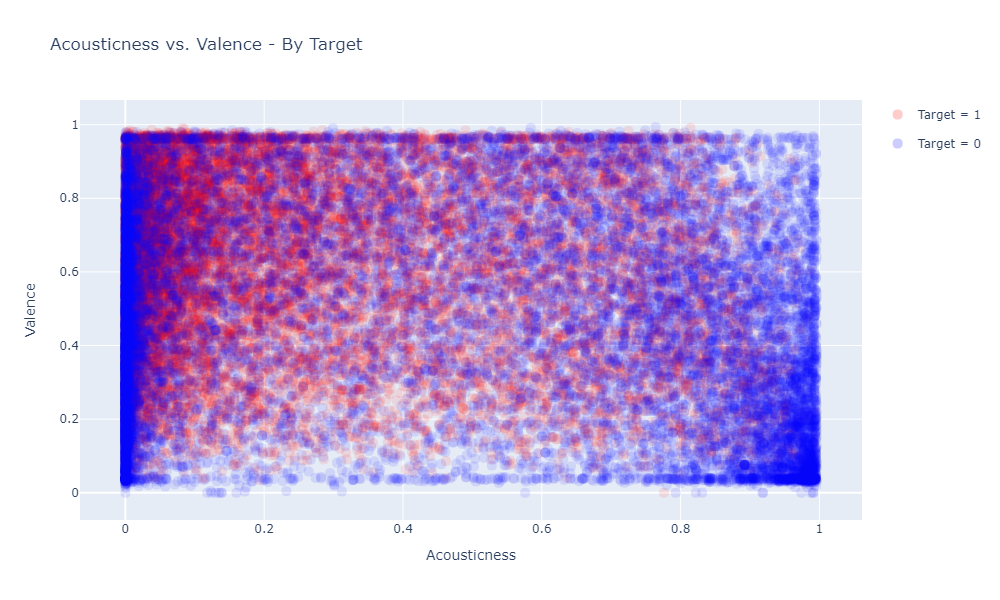

In [14]:
#Very Acoustic Songs that are also sad are not likely to be hits
Scatter(Train, "Acousticness", "Target", "Valence", "Acousticness vs. Valence - By Target")

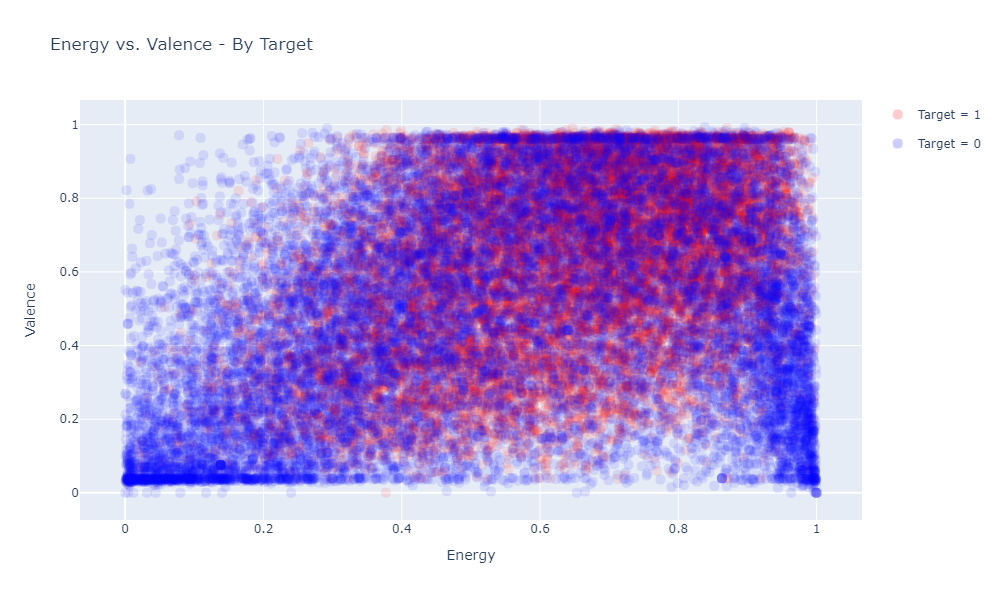

In [15]:
#Positive songs tend to make better hits than negative songs.
Scatter(Train, "Energy", "Target", "Valence", "Energy vs. Valence - By Target")

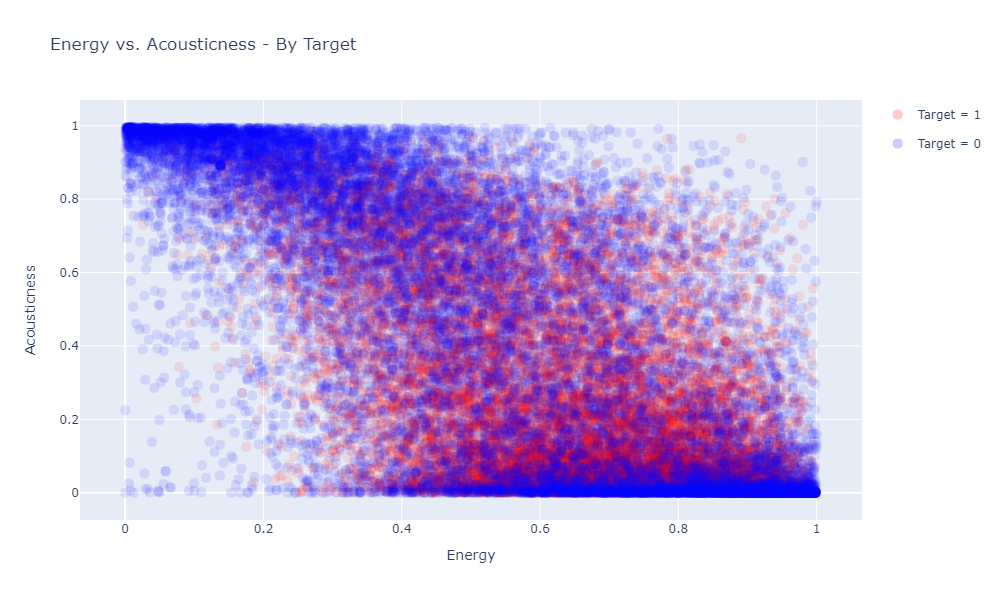

In [16]:
# Low energy Acoustic Songs tend to be Flops
Scatter(Train, "Energy", "Target", "Acousticness", "Energy vs. Acousticness - By Target")

In [17]:
Train.columns.values

array(['Track', 'Artist', 'Uri', 'Danceability', 'Energy', 'Key',
       'Loudness', 'Mode', 'Speechiness', 'Acousticness',
       'Instrumentalness', 'Liveness', 'Valence', 'Tempo', 'Duration_Ms',
       'Time_Signature', 'Chorus_Hit', 'Sections', 'Target', 'Decade',
       'LowEnergy', 'Acoustic', 'FourFour', 'Population'], dtype=object)

## Bin Variables and Clean

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




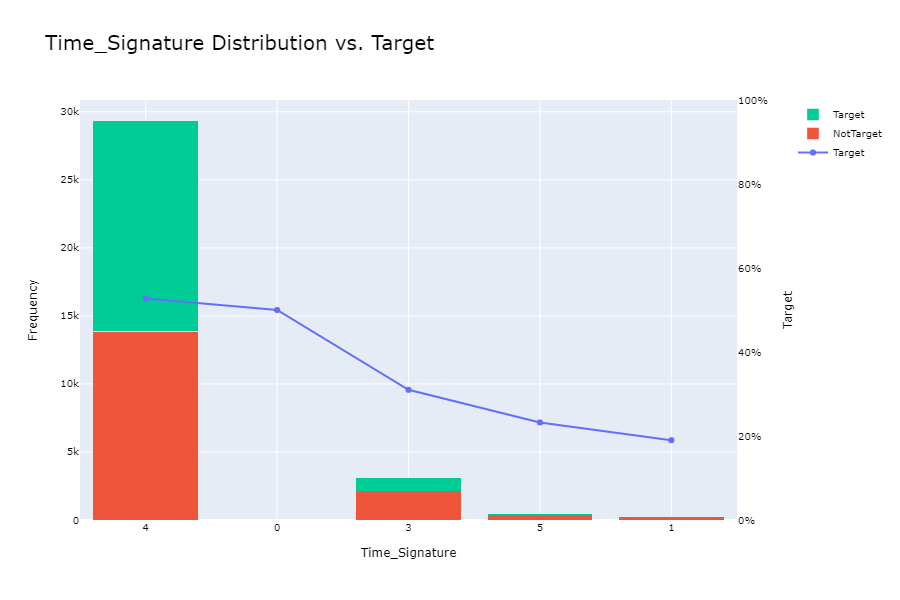

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




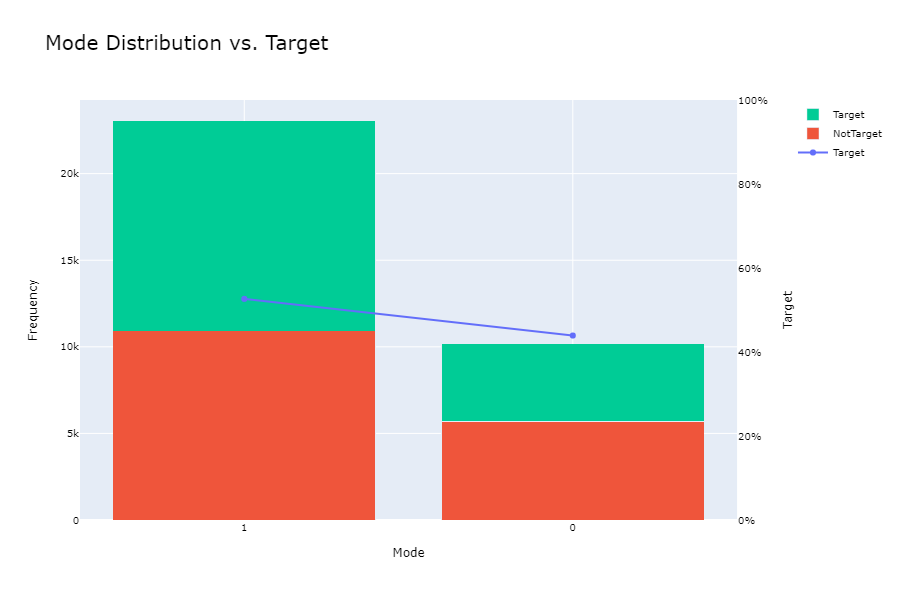

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




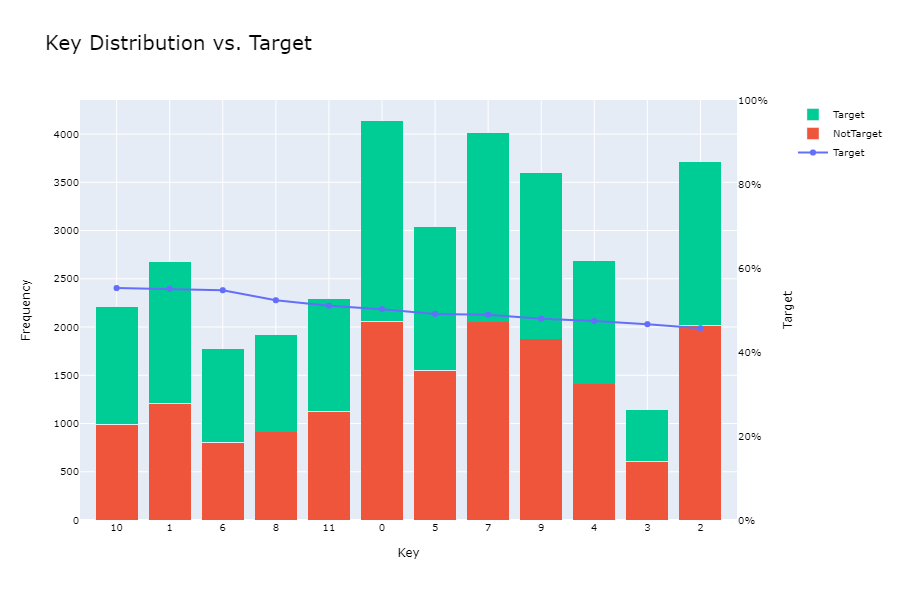

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




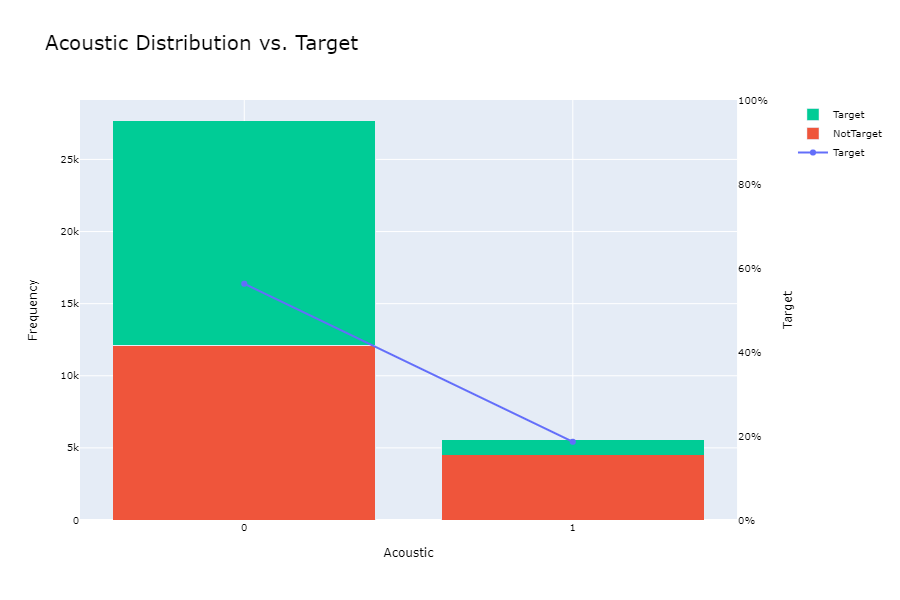

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




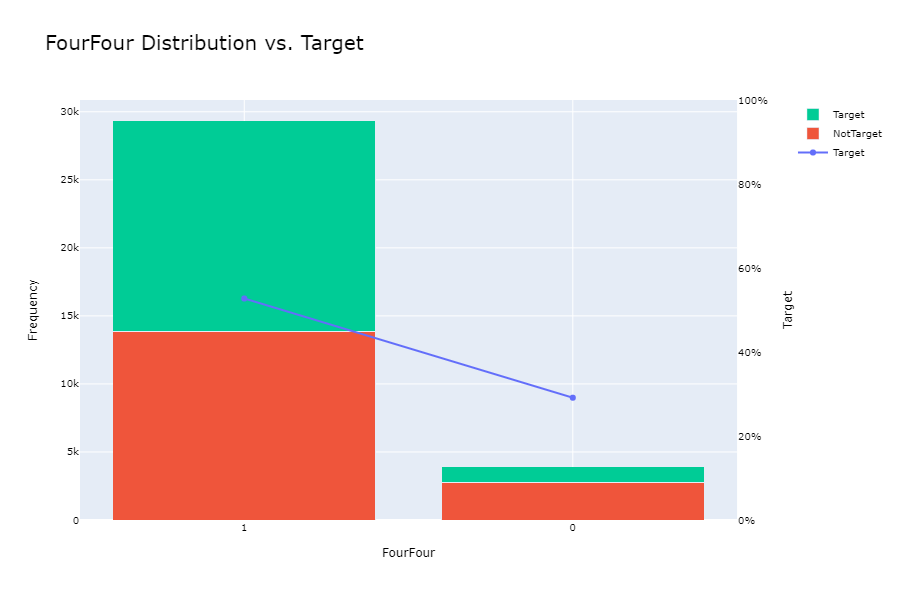

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




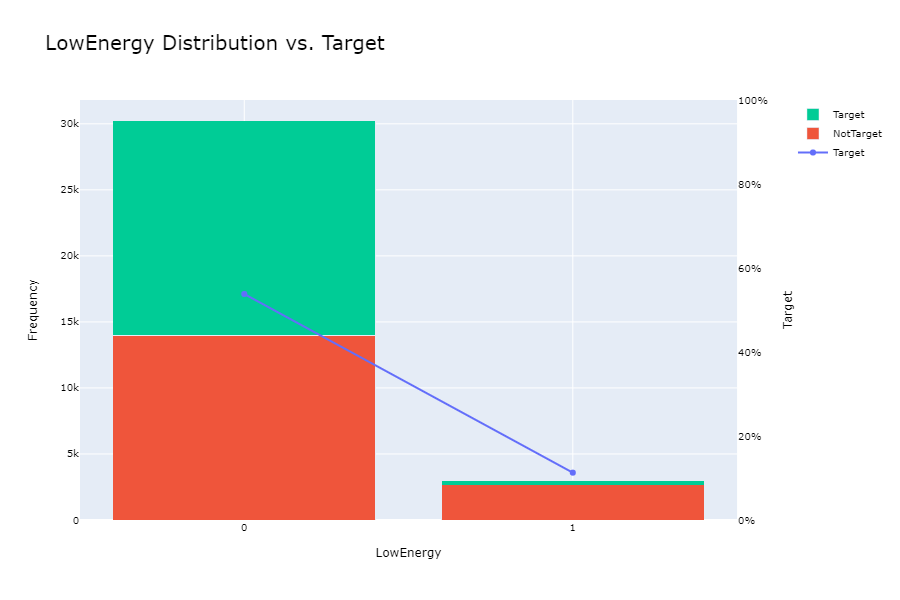

In [18]:
#4:4 Seems to be the favourable/most common time signature
#Mode
#Ordinally Encode Key
for Variable in DiscreteVars:
    Distribution(Train, "Target", Variable)

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.39691951
    IV (Jeffrey)             0.63276598
    JS (Jensen-Shannon)      0.06916280
    HHI                      0.04242569
    HHI (normalized)         0.01250149
    Cramer's V               0.35673138
    Quality score            0.00000002

  Significance tests

     Bin A  Bin B  t-statistic   p-value  P[A > B]  P[B > A]
         0      1    13.407175  0.000251  0.000053  0.999947
         1      2     2.823606  0.092887  0.042457  0.957543
         2      3     6.889953  0.008668  0.004543  0.995457
         3      4     2.460119  0.116770  0.054850  0.945150
         4      5     8.973995  0.002738  0.001079  0.998921
         5      6     4.473695  0.034420  0.017105  0.982895
         6      7     0.208191  0.648189  0.326656  0.673344
         7      8     0.194125  0.659505  0

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




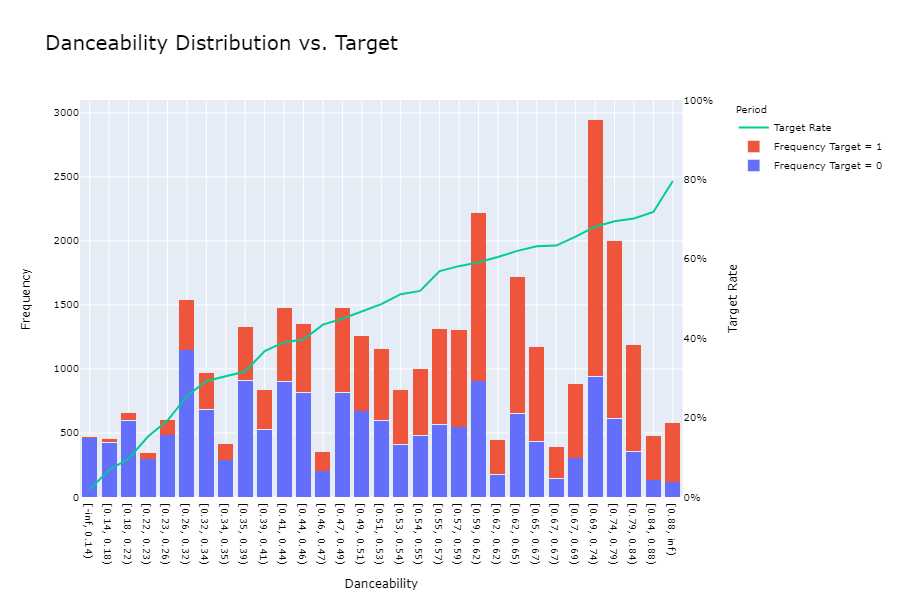

FEASIBLE
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.37397377
    IV (Jeffrey)             0.66708973
    JS (Jensen-Shannon)      0.07079659
    HHI                      0.05309579
    HHI (normalized)         0.02679290
    Cramer's V               0.35758906
    Quality score            0.00000000

  Significance tests

     Bin A  Bin B  t-statistic       p-value  P[A > B]      P[B > A]
         0      1     1.340412  2.469613e-01  0.117919  8.820814e-01
         1      2     8.360648  3.834339e-03  0.000963  9.990368e-01
         2      3    12.621611  3.813125e-04  0.000146  9.998535e-01
         3      4     0.055554  8.136670e-01  0.407112  5.928876e-01
         4      5     2.782712  9.528672e-02  0.046449  9.535511e-01
         5      6     0.815403  3.665278e-01  0.181703  8.182968e-01
         6      7     2.553466  1.100526e-01  0

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




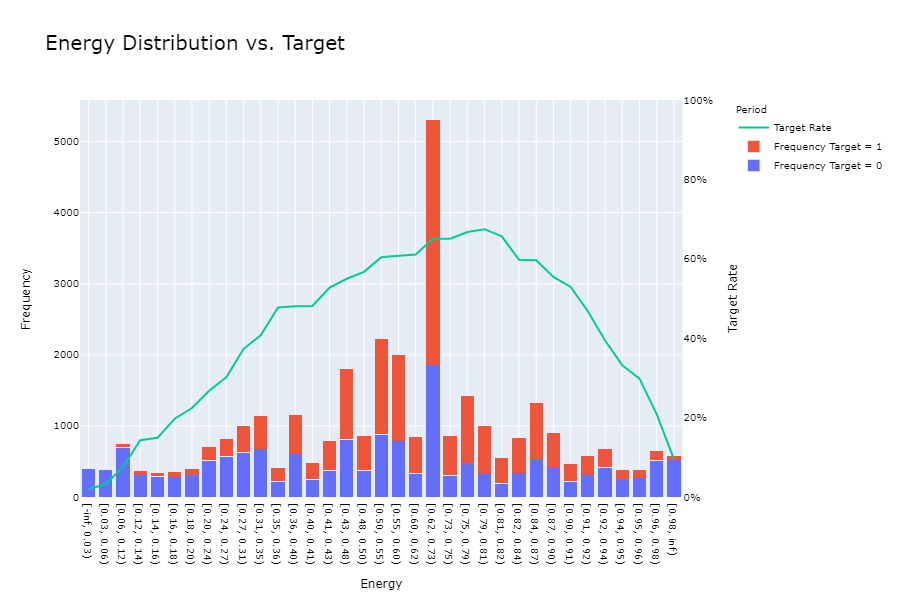

FEASIBLE
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.29265175
    IV (Jeffrey)             0.58965773
    JS (Jensen-Shannon)      0.05535432
    HHI                      0.05700451
    HHI (normalized)         0.02658530
    Cramer's V               0.31013880
    Quality score            0.00000000

  Significance tests

     Bin A  Bin B  t-statistic   p-value      P[A > B]      P[B > A]
         0      1    19.562724  0.000010  1.481719e-07  9.999999e-01
         1      2     8.198871  0.004192  2.137448e-03  9.978626e-01
         2      3     5.133013  0.023475  1.114896e-02  9.888510e-01
         3      4     0.793927  0.372915  1.879748e-01  8.120252e-01
         4      5     5.875567  0.015352  6.741442e-03  9.932586e-01
         5      6     2.733346  0.098273  4.696943e-02  9.530306e-01
         6      7     6.052650  0.013885  6.664

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




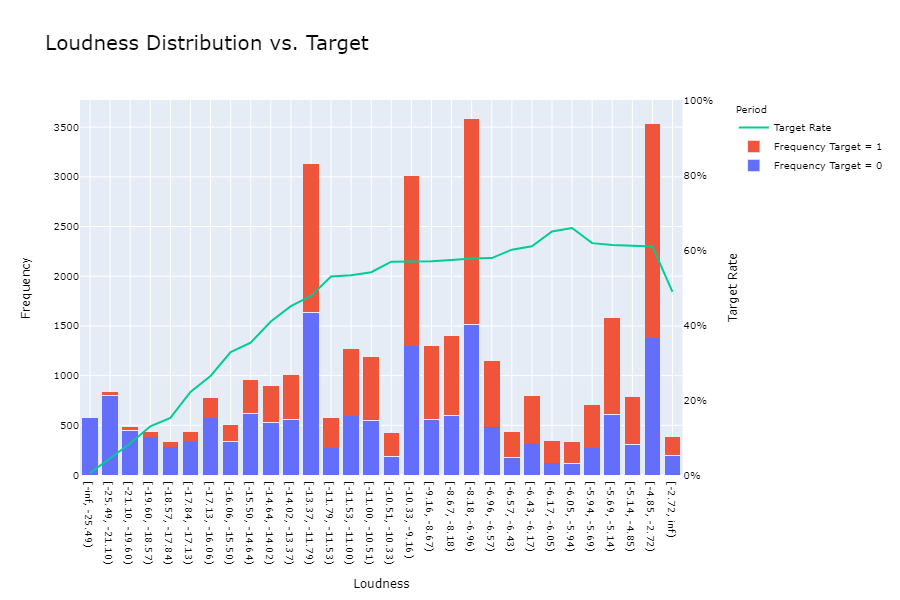

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.16591586
    IV (Jeffrey)             0.13720998
    JS (Jensen-Shannon)      0.01662631
    HHI                      0.33213690
    HHI (normalized)         0.29285083
    Cramer's V               0.17979077
    Quality score            0.00000765

  Significance tests

     Bin A  Bin B  t-statistic   p-value  P[A > B]      P[B > A]
         0      1     4.513602  0.033626  0.984674  1.532553e-02
         1      2    11.147198  0.000842  0.999792  2.078172e-04
         2      3     0.179730  0.671606  0.667186  3.328139e-01
         3      4     1.701315  0.192116  0.903723  9.627732e-02
         4      5     0.003902  0.950191  0.522879  4.771211e-01
         5      6     0.122978  0.725826  0.638205  3.617951e-01
         6      7     3.511555  0.060942  0.970335  2.966538e-02
         7 

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




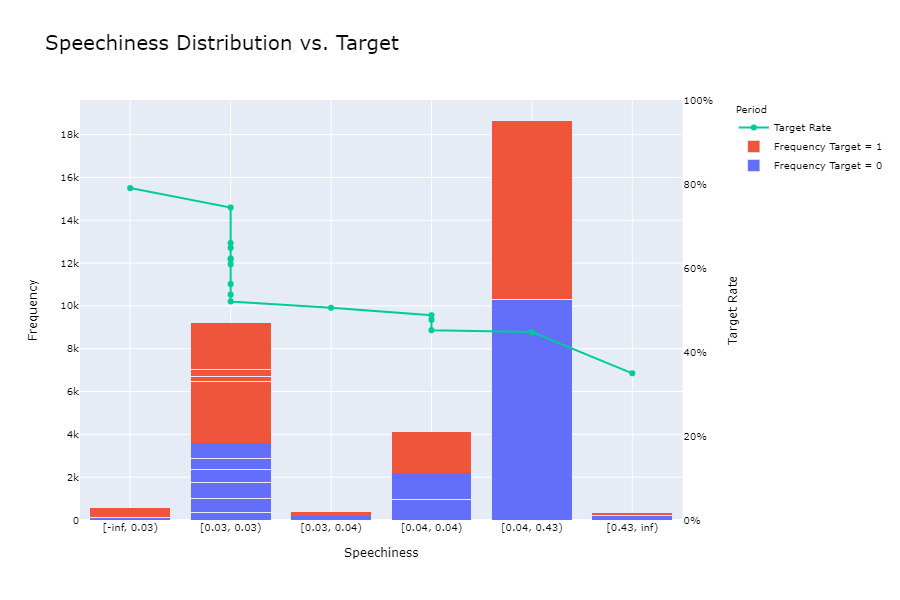

FEASIBLE
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.44969362
    IV (Jeffrey)             0.98212023
    JS (Jensen-Shannon)      0.09695644
    HHI                      0.03659722
    HHI (normalized)         0.01251215
    Cramer's V               0.41406705
    Quality score            0.00000000

  Significance tests

     Bin A  Bin B  t-statistic       p-value      P[A > B]  P[B > A]
         0      1     6.949662  8.383506e-03  2.233926e-03  0.997766
         1      2    24.395359  7.845746e-07  4.312258e-08  1.000000
         2      3    18.999235  1.307709e-05  1.793590e-06  0.999998
         3      4     1.680482  1.948605e-01  9.666055e-02  0.903339
         4      5     4.043555  4.434031e-02  2.112790e-02  0.978872
         5      6    22.831503  1.768431e-06  3.473192e-07  1.000000
         6      7     7.388899  6.562767e-03  2

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




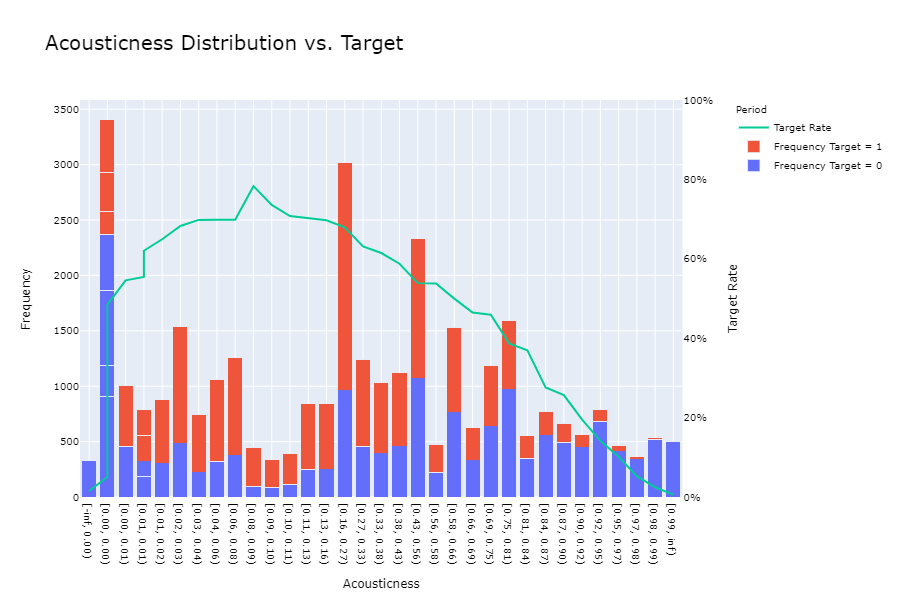

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.48173532
    IV (Jeffrey)             1.11224095
    JS (Jensen-Shannon)      0.11668459
    HHI                      0.11198626
    HHI (normalized)         0.08027148
    Cramer's V               0.45551450
    Quality score            0.00000000

  Significance tests

     Bin A  Bin B  t-statistic       p-value  P[A > B]      P[B > A]
         0      1    25.989173  3.433375e-07  1.000000  3.943815e-10
         1      2     0.665804  4.145182e-01  0.792269  2.077305e-01
         2      3     2.693371  1.007664e-01  0.949080  5.092014e-02
         3      4     0.006394  9.362658e-01  0.530668  4.693319e-01
         4      5     0.946732  3.305524e-01  0.835177  1.648234e-01
         5      6     0.020741  8.854875e-01  0.558497  4.415032e-01
         6      7     0.167935  6.819533e-01  0.

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




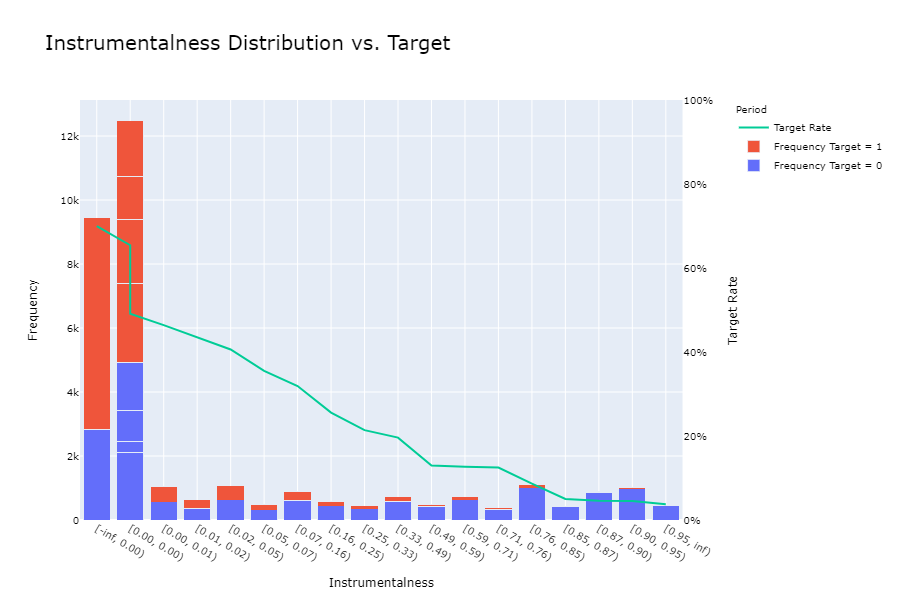

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.08957145
    IV (Jeffrey)             0.04858259
    JS (Jensen-Shannon)      0.00598121
    HHI                      0.41258794
    HHI (normalized)         0.36363693
    Cramer's V               0.10857387
    Quality score            0.00148832

  Significance tests

     Bin A  Bin B  t-statistic   p-value  P[A > B]      P[B > A]
         0      1     4.358927  0.036815  0.982218  1.778196e-02
         1      2     0.019220  0.889738  0.553069  4.469308e-01
         2      3     3.023213  0.082081  0.960305  3.969471e-02
         3      4     3.626977  0.056850  0.971901  2.809885e-02
         4      5     1.349806  0.245312  0.877940  1.220597e-01
         5      6     0.172713  0.677712  0.660908  3.390924e-01
         6      7     1.127707  0.288265  0.855871  1.441293e-01
         7 

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




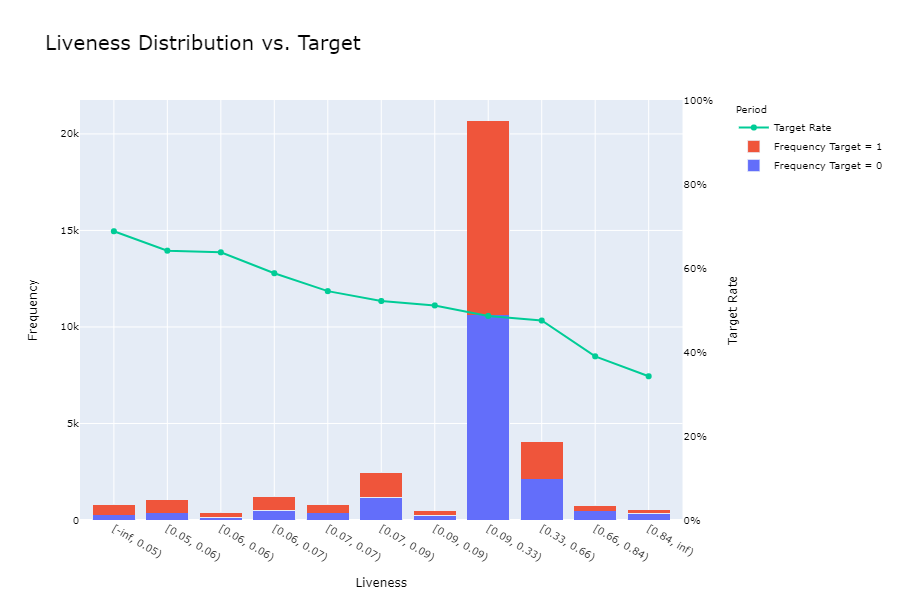

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.28386921
    IV (Jeffrey)             0.49002013
    JS (Jensen-Shannon)      0.04710838
    HHI                      0.07554034
    HHI (normalized)         0.03702119
    Cramer's V               0.28753046
    Quality score            0.00000051

  Significance tests

     Bin A  Bin B  t-statistic   p-value  P[A > B]  P[B > A]
         0      1    13.600467  0.000226  0.000081  0.999919
         1      2     6.666479  0.009824  0.003404  0.996596
         2      3     8.414327  0.003723  0.001764  0.998236
         3      4    13.244864  0.000273  0.000078  0.999922
         4      5     1.131431  0.287470  0.144490  0.855510
         5      6     7.120232  0.007622  0.003369  0.996631
         6      7     4.177112  0.040973  0.020238  0.979762
         7      8     0.081117  0.775790  0

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




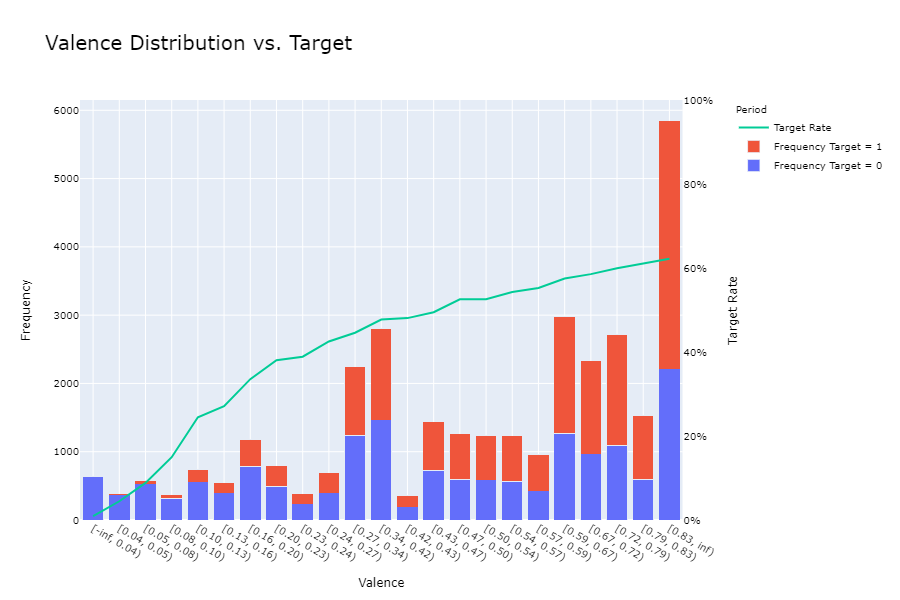

FEASIBLE
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.10658715
    IV (Jeffrey)             0.05120204
    JS (Jensen-Shannon)      0.00620629
    HHI                      0.07404659
    HHI (normalized)         0.03378775
    Cramer's V               0.10988661
    Quality score            0.00000000

  Significance tests

     Bin A  Bin B  t-statistic       p-value      P[A > B]  P[B > A]
         0      1    14.444658  1.443387e-04  4.276668e-05  0.999957
         1      2    34.813255  3.628944e-09  8.306478e-10  1.000000
         2      3     1.202063  2.729098e-01  1.365843e-01  0.863416
         3      4     1.749895  1.858899e-01  9.290528e-02  0.907095
         4      5     0.097885  7.543832e-01  3.771006e-01  0.622899
         5      6     0.004527  9.463571e-01  4.731575e-01  0.526842
         6      7     0.267278  6.051634e-01  3

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




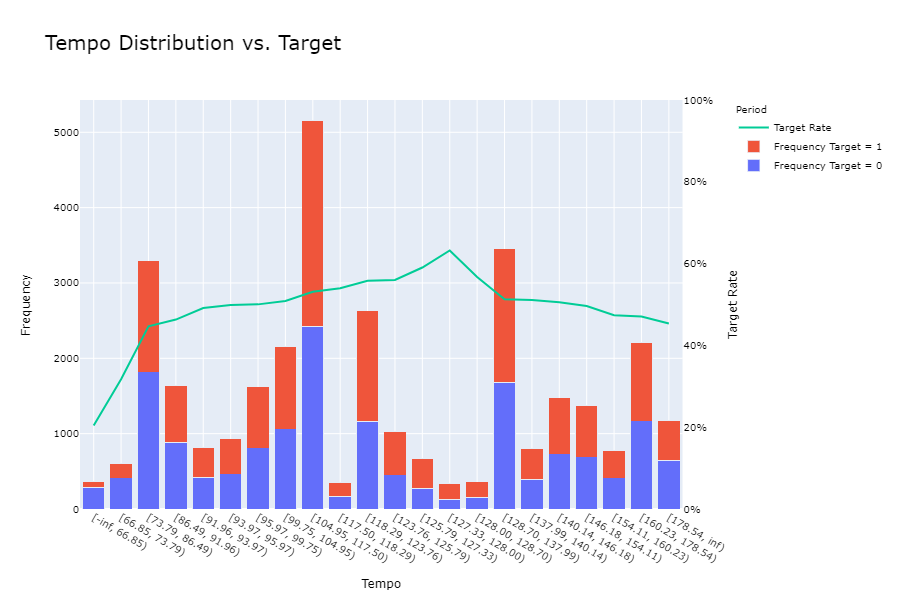

FEASIBLE
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.28752704
    IV (Jeffrey)             0.50508224
    JS (Jensen-Shannon)      0.04930298
    HHI                      0.04247156
    HHI (normalized)         0.01587355
    Cramer's V               0.29432068
    Quality score            0.00000000

  Significance tests

     Bin A  Bin B  t-statistic       p-value      P[A > B]      P[B > A]
         0      1     4.116549  4.246561e-02  1.539274e-02  9.846073e-01
         1      2    15.358390  8.892515e-05  1.348169e-05  9.999865e-01
         2      3    27.937130  1.253217e-07  5.355024e-09  1.000000e+00
         3      4    14.288983  1.567798e-04  4.704719e-05  9.999530e-01
         4      5     5.578849  1.817866e-02  8.546758e-03  9.914532e-01
         5      6    11.204909  8.158122e-04  3.487393e-04  9.996513e-01
         6      7  

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




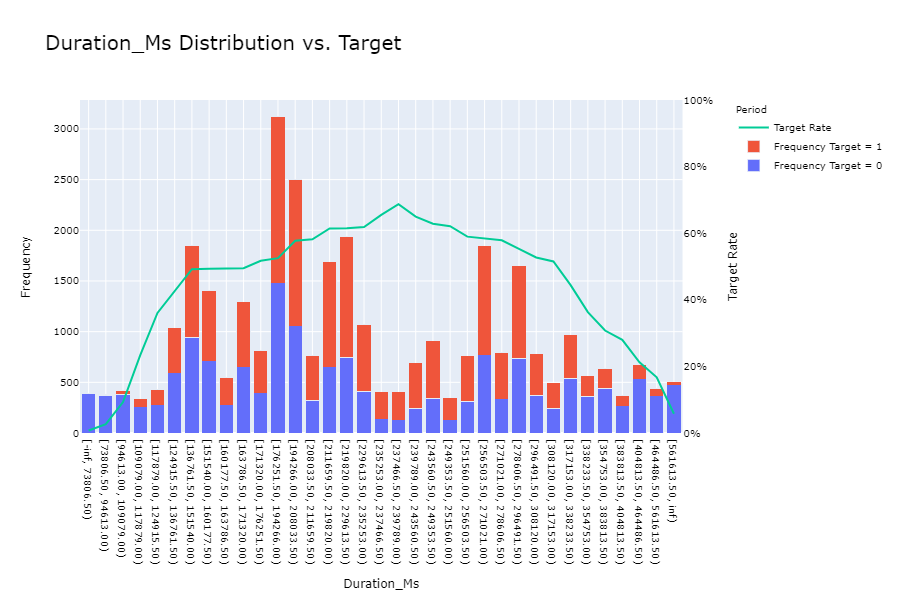

FEASIBLE
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.08130017
    IV (Jeffrey)             0.05683688
    JS (Jensen-Shannon)      0.00635760
    HHI                      0.15143088
    HHI (normalized)         0.10428815
    Cramer's V               0.10816826
    Quality score            0.00000054

  Significance tests

     Bin A  Bin B  t-statistic       p-value      P[A > B]  P[B > A]
         0      1   110.317974  8.346837e-26  4.348227e-34  1.000000
         1      2     4.683971  3.044529e-02  1.469730e-02  0.985303
         2      3     0.346378  5.561706e-01  2.781789e-01  0.721821
         3      4     0.015031  9.024227e-01  4.512361e-01  0.548764
         4      5     0.177815  6.732579e-01  3.361828e-01  0.663817
         5      6     4.927354  2.643476e-02  1.237330e-02  0.987627
         6      7     8.294117  3.977370e-03  9

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




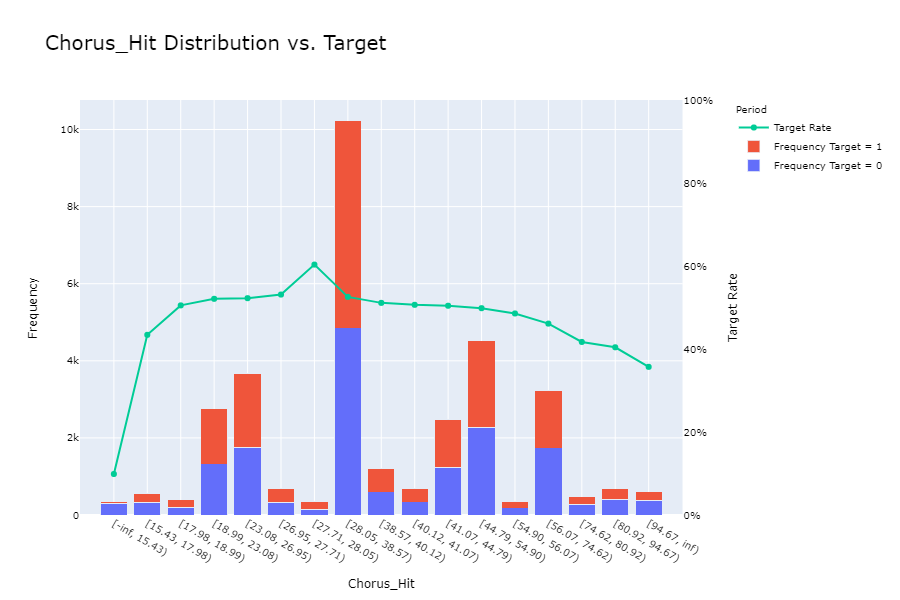

OPTIMAL
---------------------------------------------
OptimalBinning: Binary Binning Table Analysis
---------------------------------------------

  General metrics

    Gini index               0.23050762
    IV (Jeffrey)             0.33210820
    JS (Jensen-Shannon)      0.03549235
    HHI                      0.08897793
    HHI (normalized)         0.04102940
    Cramer's V               0.25274703
    Quality score            0.01535423

  Significance tests

     Bin A  Bin B  t-statistic       p-value      P[A > B]      P[B > A]
         0      1    14.958724  1.098888e-04  2.015069e-05  9.999798e-01
         1      2    45.007539  1.962773e-11  1.789551e-13  1.000000e+00
         2      3    63.646093  1.489040e-15  2.827645e-18  1.000000e+00
         3      4    24.121080  9.046456e-07  1.811140e-07  9.999998e-01
         4      5    13.741138  2.098083e-04  7.482219e-05  9.999252e-01
         5      6    12.155643  4.893957e-04  1.807480e-04  9.998193e-01
         6      7   

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




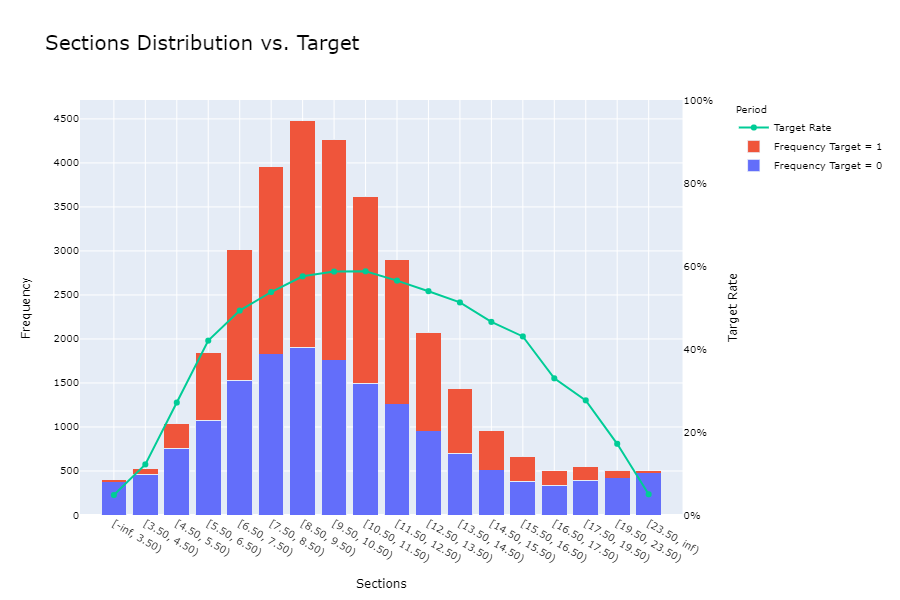

In [19]:
BinOut = {}

for Variable in ContinuousVars:
    BinOut = BinVariable(Train, "Target", Variable, BinOut, Trend="auto")

In [22]:
Variables = ["Mode", "Acoustic", "FourFour", "LowEnergy", "Liveness", "Instrumentalness", "Danceability"]

SquareVariables = ["Loudness", "Duration_Ms", "Energy", "Acousticness", "Tempo", "Sections", "Chorus_Hit"]

SqrtVariables = ["Valence"]

OrdinalVariables = ["Key"]

ModVars = Variables+SquareVariables+SqrtVariables+OrdinalVariables
ModVarsClean = [str(Variable)+"Clean" for Variable in ModVars]

In [23]:
for Variable in ModVars:
    Train[Variable+"Clean"] = Train[Variable]
    Test[Variable+"Clean"] = Test[Variable]

In [24]:
for Variable in ContinuousVars:
    
    Bins = BinOut[Variable].tolist()
    Bins.insert(0, -np.inf)
    Bins.insert(len(Bins), np.inf)
    
    Train[Variable + "Clean"] = pd.cut(Train[Variable], bins=Bins, labels = range(0, len(Bins)-1)).values
    Test[Variable + "Clean"] = pd.cut(Test[Variable], bins=Bins, labels = range(0, len(Bins)-1)).values

In [25]:
for Variable in ModVarsClean:
    Train[Variable]  = pd.to_numeric(Train[Variable])
    Test[Variable]  = pd.to_numeric(Test[Variable])

for Variable in SquareVariables:
    Train[str(Variable)+"SquaredClean"] = Train[Variable+"Clean"]**2
    Test[str(Variable)+"SquaredClean"] = Test[Variable+"Clean"]**2
    ModVarsClean.append(str(Variable)+"SquaredClean")
    
for Variable in SqrtVariables:
    Train[str(Variable)+"SqrtClean"] = Train[Variable+"Clean"]**0.5
    Test[str(Variable)+"SqrtClean"] = Test[Variable+"Clean"]**0.5
    ModVarsClean.append(str(Variable)+"SqrtClean")
    
for Variable in OrdinalVariables:
    Index = pd.pivot_table(Train, index=Variable, values="Target", aggfunc="mean").sort_values(by="Target", ascending=False).index.values
    Labels = {}
    for i in range(len(Index)):
        Labels[Index[i]] = i

    Train[str(Variable)+"Clean"] = Train.Key.map(Labels)
    Test[str(Variable)+"Clean"] = Test.Key.map(Labels)

                 Target
LoudnessClean          
0              0.005208
1              0.045400
2              0.084016
3              0.129841
4              0.152239
5              0.221461
6              0.264175
7              0.328032
8              0.352818
9              0.409396
10             0.450148
11             0.477621
12             0.529412
13             0.532600
14             0.540791
15             0.568765
16             0.569006
17             0.570223
18             0.573571
19             0.577009
20             0.578397
21             0.600917
22             0.609787
23             0.649425
24             0.658754
25             0.618310
26             0.613046
27             0.611675
28             0.609521
29             0.488251
               Target
LoudnessClean        
0                 576
1                 837
2                 488
3                 439
4                 335
5                 438
6                 776
7                 503
8           

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




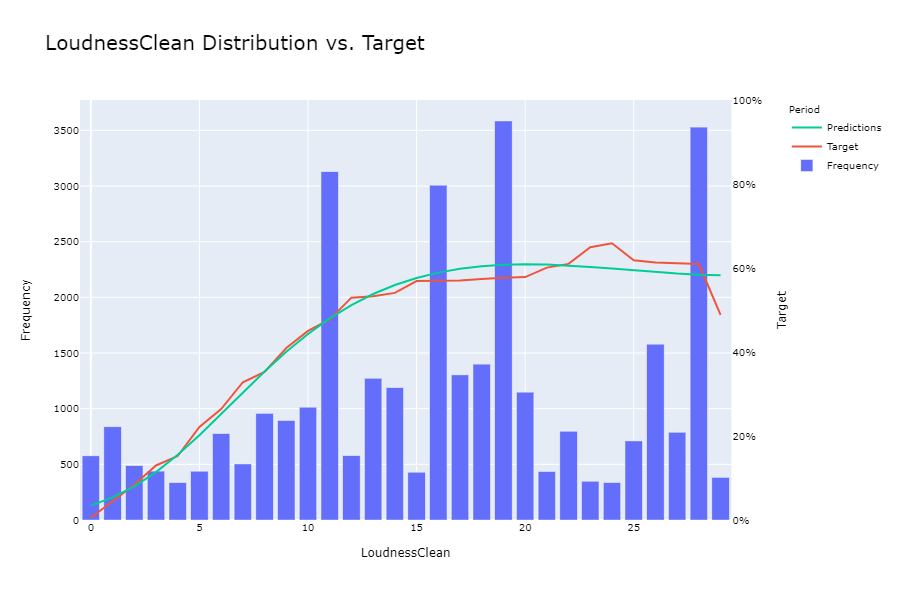

                    Target
Duration_MsClean          
0                 0.007614
1                 0.026385
2                 0.093079
3                 0.233533
4                 0.360465
5                 0.427053
6                 0.491892
7                 0.493238
8                 0.494526
9                 0.494973
10                0.517199
11                0.525152
12                0.577369
13                0.581699
14                0.614472
15                0.614551
16                0.618692
17                0.655087
18                0.687345
19                0.649783
20                0.628571
21                0.620991
22                0.589710
23                0.583965
24                0.578616
25                0.553062
26                0.526992
27                0.515152
28                0.444099
29                0.362989
30                0.307692
31                0.279891
32                0.212389
33                0.167048
34                0.057769
 

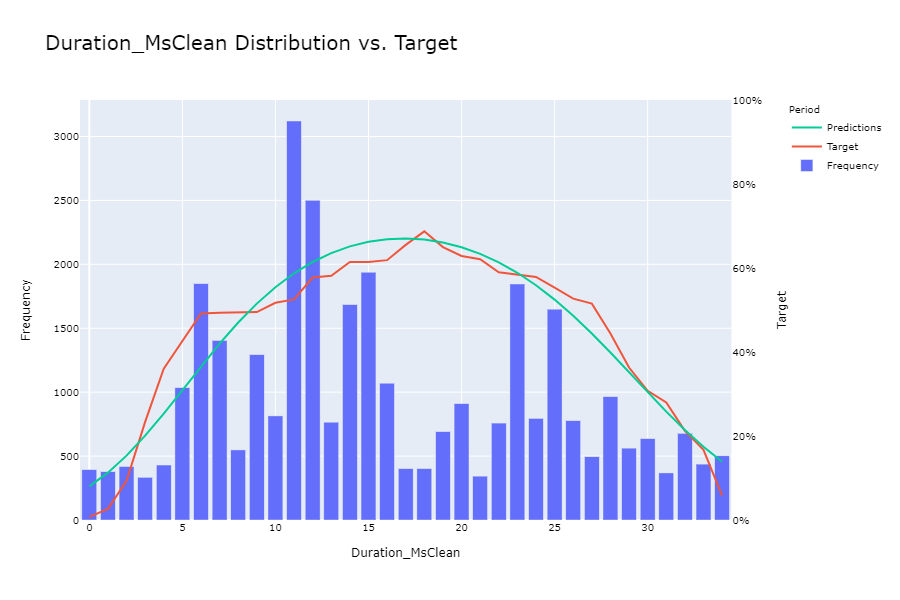

               Target
EnergyClean          
0            0.019704
1            0.032746
2            0.075597
3            0.142857
4            0.149123
5            0.197143
6            0.224181
7            0.267705
8            0.301587
9            0.373253
10           0.407375
11           0.477218
12           0.480653
13           0.481250
14           0.527319
15           0.549695
16           0.567130
17           0.603960
18           0.607677
19           0.610588
20           0.650396
21           0.650812
22           0.667367
23           0.674651
24           0.656475
25           0.597605
26           0.596531
27           0.554336
28           0.529032
29           0.468048
30           0.394161
31           0.331579
32           0.298153
33           0.208333
34           0.095652
             Target
EnergyClean        
0               406
1               397
2               754
3               364
4               342
5               350
6               397
7     

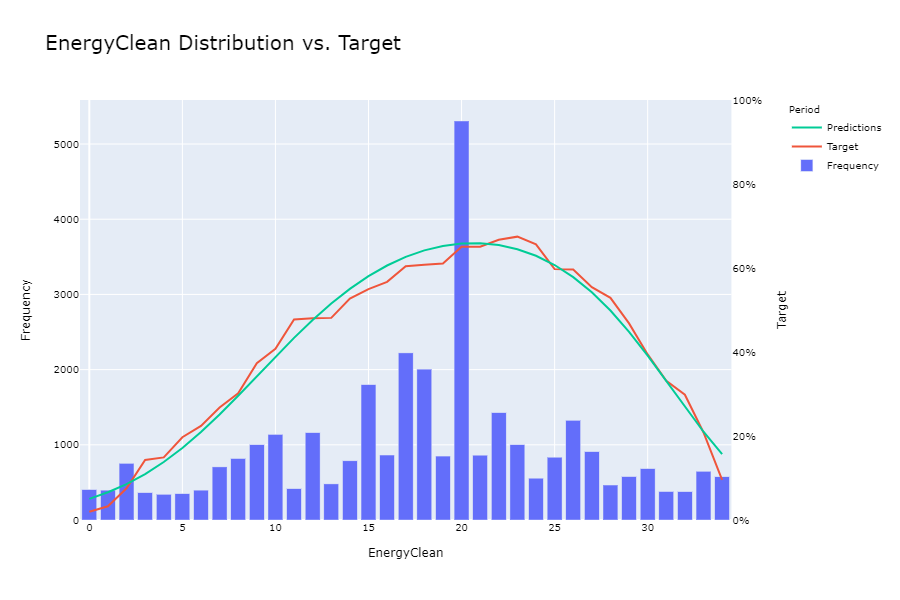

                     Target
AcousticnessClean          
0                  0.014970
1                  0.050360
2                  0.148087
3                  0.260526
4                  0.302564
5                  0.363924
6                  0.484756
7                  0.545635
8                  0.554479
9                  0.620321
10                 0.649143
11                 0.682705
12                 0.697987
13                 0.698398
14                 0.698565
15                 0.782998
16                 0.735736
17                 0.707692
18                 0.702381
19                 0.697150
20                 0.679483
21                 0.631240
22                 0.614563
23                 0.587657
24                 0.538858
25                 0.537815
26                 0.499673
27                 0.464744
28                 0.459072
29                 0.387077
30                 0.369565
31                 0.275907
32                 0.256798
33                 0

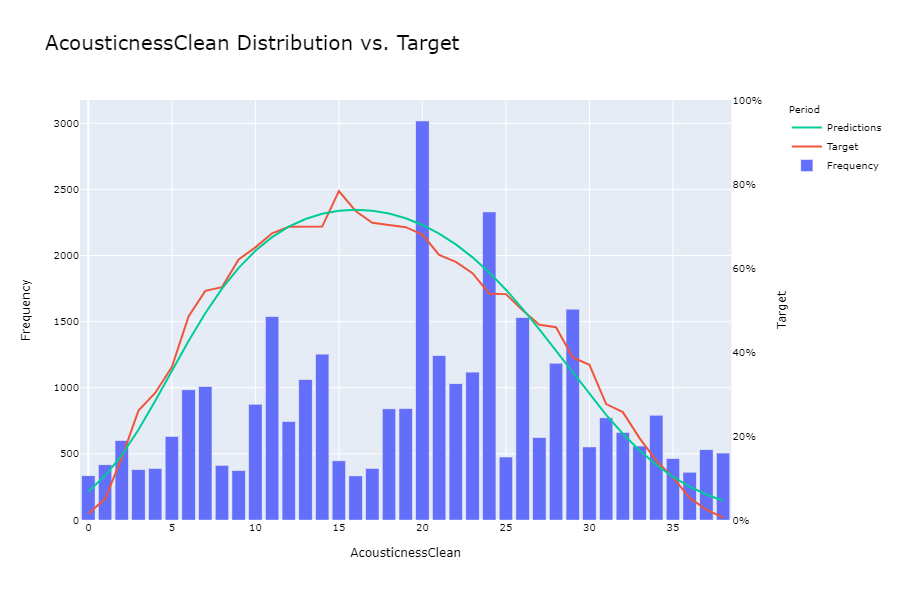

              Target
TempoClean          
0           0.204420
1           0.317276
2           0.446640
3           0.463132
4           0.491422
5           0.498925
6           0.500309
7           0.508813
8           0.530929
9           0.539548
10          0.558051
11          0.559883
12          0.590433
13          0.632047
14          0.567039
15          0.513043
16          0.511222
17          0.505420
18          0.496356
19          0.473684
20          0.470801
21          0.453538
            Target
TempoClean        
0              362
1              602
2             3289
3             1641
4              816
5              930
6             1617
7             2156
8             5157
9              354
10            2627
11            1027
12             669
13             337
14             358
15            3450
16             802
17            1476
18            1372
19             779
20            2209
21            1173
Optimization terminated successfully.
  

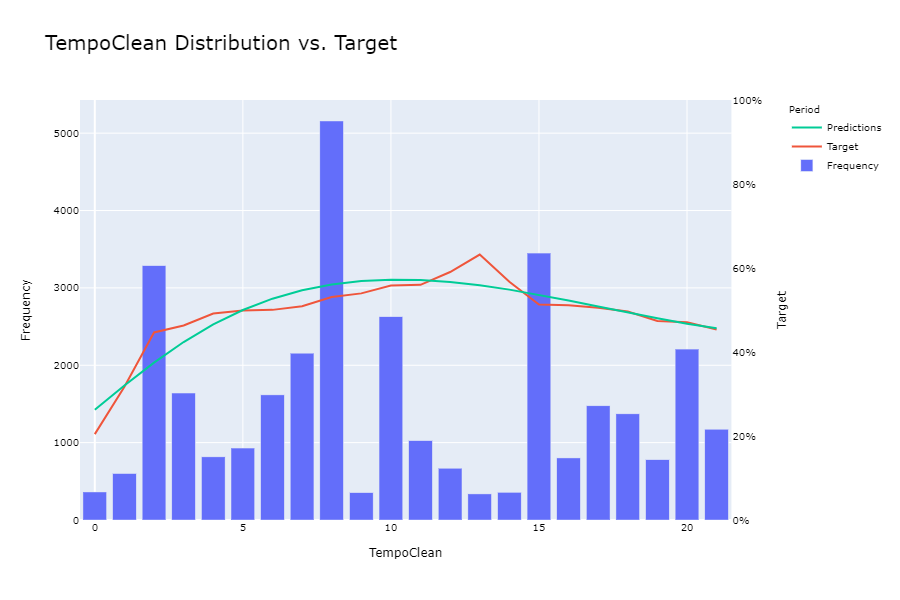

                 Target
SectionsClean          
0              0.048101
1              0.121905
2              0.270974
3              0.420141
4              0.492532
5              0.537332
6              0.575128
7              0.586635
8              0.587179
9              0.564767
10             0.539315
11             0.512212
12             0.465336
13             0.430285
14             0.329341
15             0.276243
16             0.171598
17             0.049900
               Target
SectionsClean        
0                 395
1                 525
2                1037
3                1847
4                3013
5                3951
6                4479
7                4265
8                3619
9                2895
10               2073
11               1433
12                952
13                667
14                501
15                543
16                507
17                501
Optimization terminated successfully.
         Current function value: 0.536145


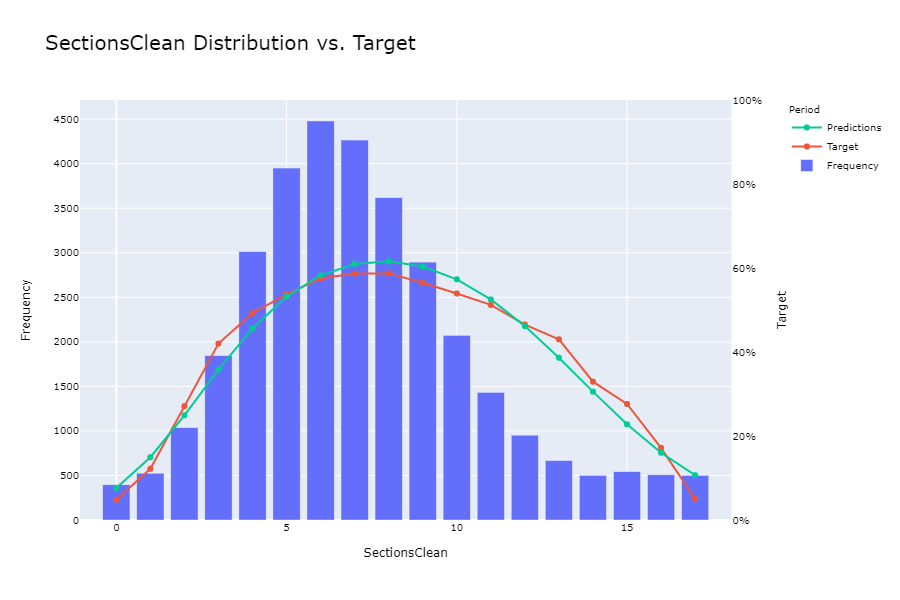

                   Target
Chorus_HitClean          
0                0.098802
1                0.434164
2                0.505076
3                0.520917
4                0.522461
5                0.531205
6                0.603399
7                0.525570
8                0.511166
9                0.506494
10               0.504232
11               0.498340
12               0.485632
13               0.461182
14               0.417021
15               0.404130
16               0.357022
                 Target
Chorus_HitClean        
0                   334
1                   562
2                   394
3                  2749
4                  3673
5                   689
6                   353
7                 10227
8                  1209
9                   693
10                 2481
11                 4519
12                  348
13                 3233
14                  470
15                  678
16                  591
Optimization terminated successfully.
         Cur

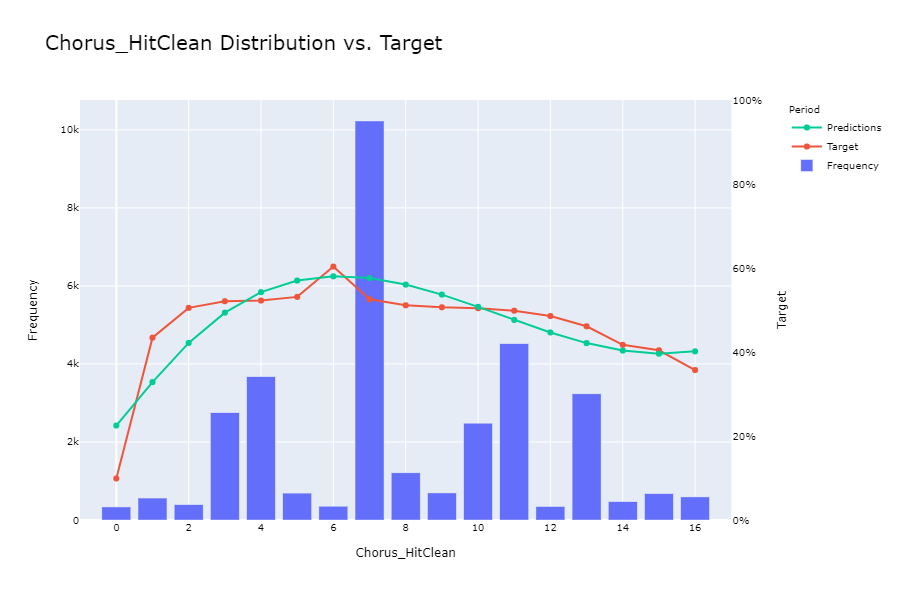

In [26]:
#Plot polynomial assumptions for verification
for Variable in SquareVariables: 
    BinPlot(Train, Variable+"Clean", "Target", Proof = "Square" if Variable in SquareVariables else "Cubed")

             Target
ModeClean          
-1.0       0.439197
 1.0       0.526499
           Target
ModeClean        
-1.0        10164
 1.0        23039


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




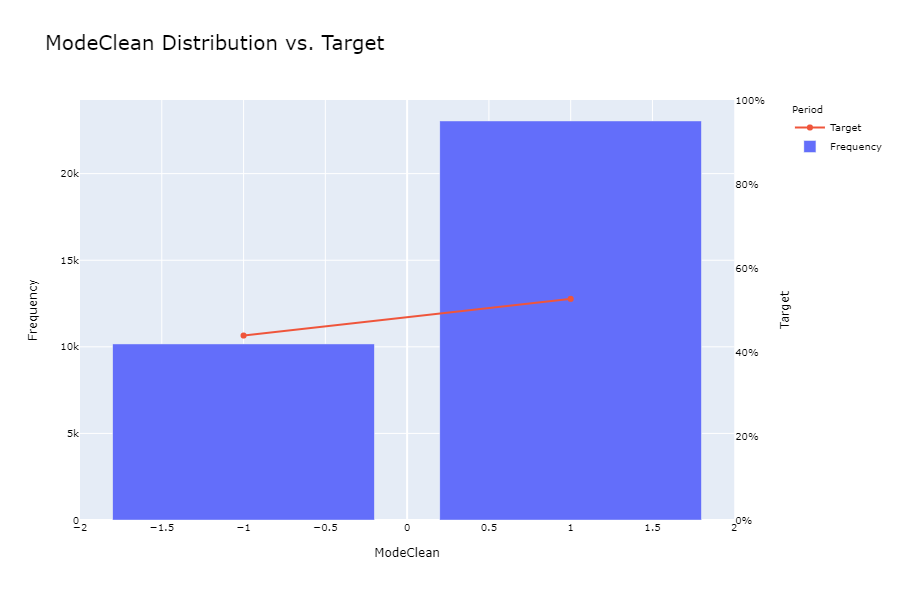

                 Target
AcousticClean          
-1.0           0.562556
 1.0           0.186282
               Target
AcousticClean        
-1.0            27663
 1.0             5540


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




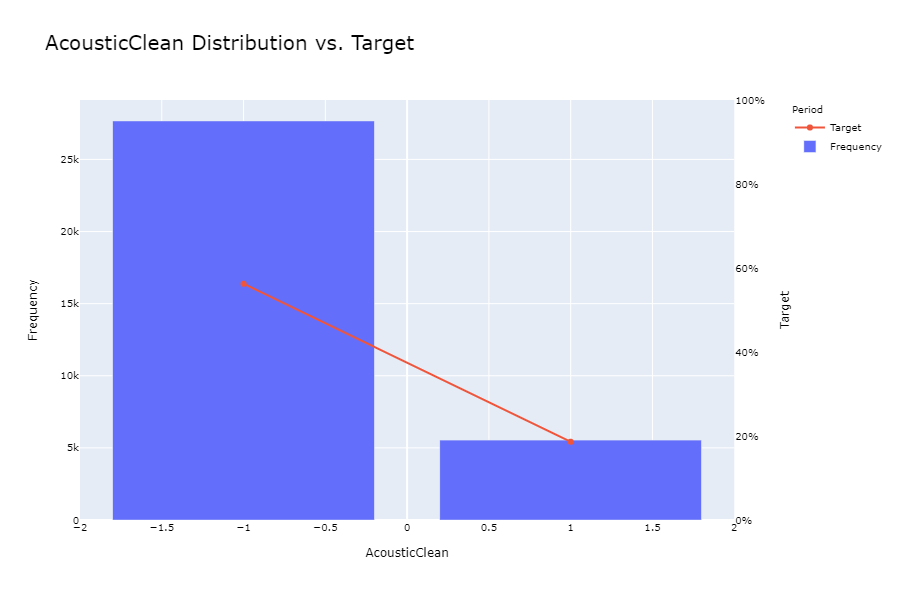

                 Target
FourFourClean          
-1.0           0.291162
 1.0           0.527386
               Target
FourFourClean        
-1.0             3881
 1.0            29322


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




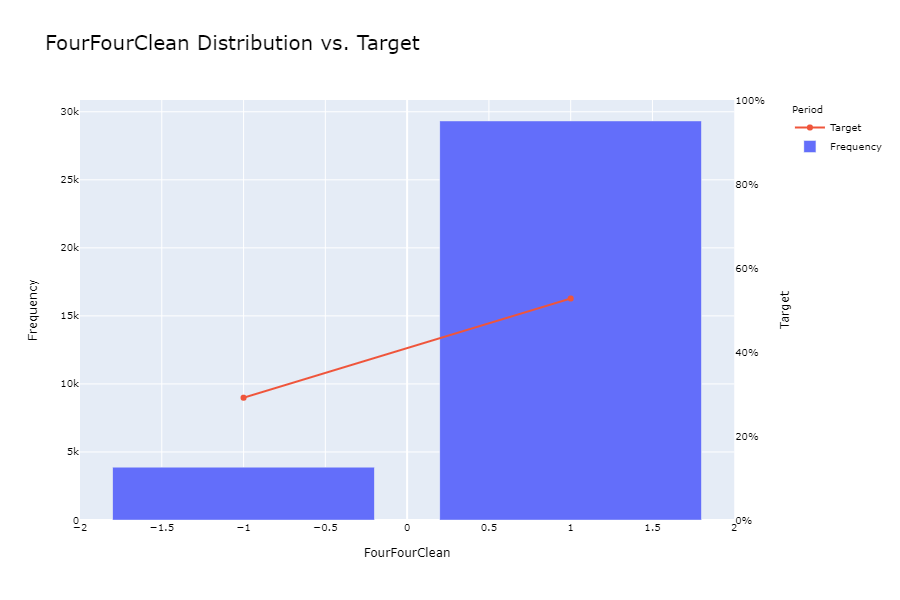

                  Target
LowEnergyClean          
-1.0            0.538080
 1.0            0.112709
                Target
LowEnergyClean        
-1.0             30213
 1.0              2990


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




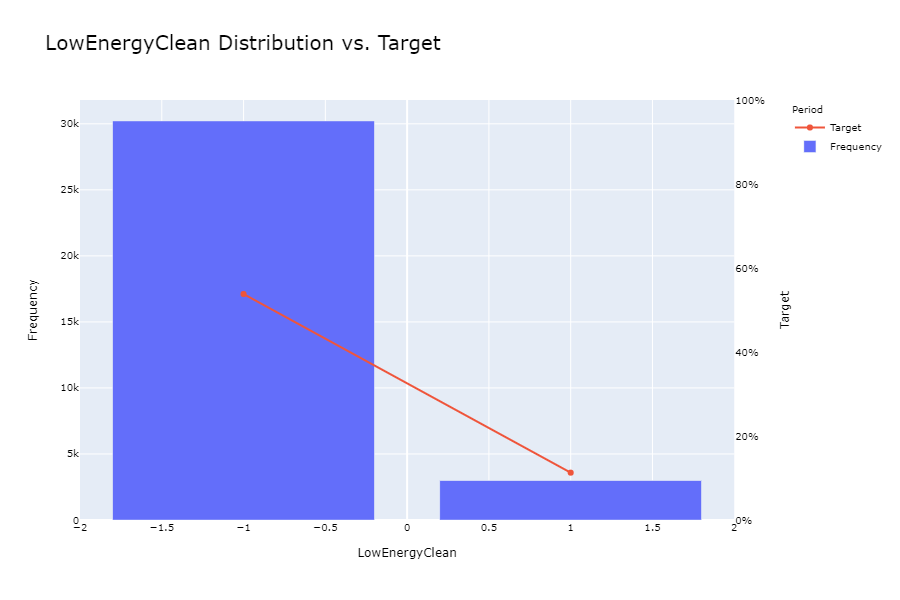

                 Target
LivenessClean          
-1.0           0.687500
-0.8           0.641273
-0.6           0.637306
-0.4           0.587561
-0.2           0.544895
 0.0           0.521420
 0.2           0.510870
 0.4           0.485848
 0.6           0.474914
 0.8           0.389696
 1.0           0.342205
               Target
LivenessClean        
-1.0              816
-0.8             1037
-0.6              386
-0.4             1222
-0.2              813
 0.0             2451
 0.2              460
 0.4            20669
 0.6             4066
 0.8              757
 1.0              526


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




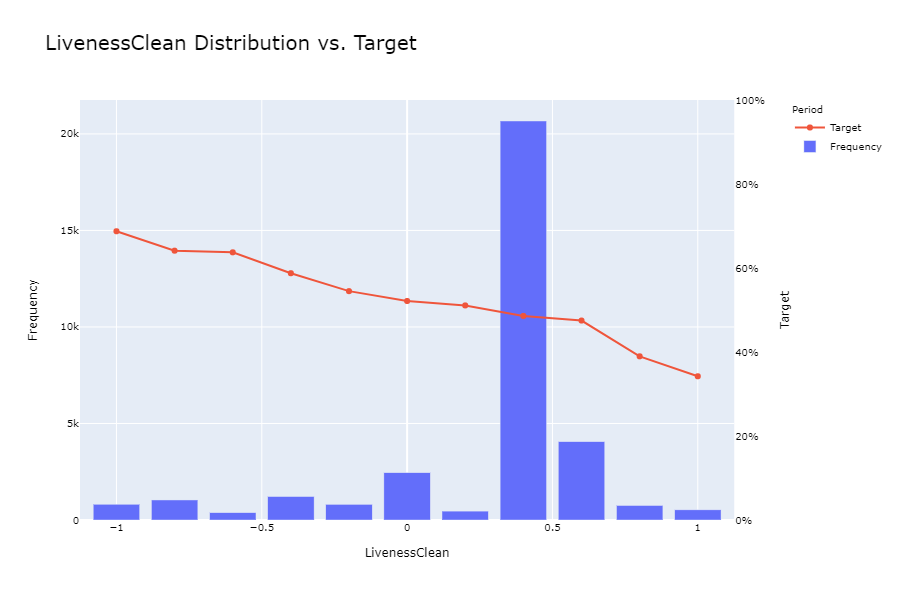

                         Target
InstrumentalnessClean          
-1.000000              0.699746
-0.923077              0.654253
-0.846154              0.643902
-0.769231              0.612500
-0.692308              0.610209
-0.615385              0.577878
-0.538462              0.574010
-0.461538              0.566085
-0.384615              0.549254
-0.307692              0.527205
-0.230769              0.490953
-0.153846              0.464115
-0.076923              0.434505
 0.000000              0.406043
 0.076923              0.354906
 0.153846              0.319005
 0.230769              0.255613
 0.307692              0.213964
 0.384615              0.196133
 0.461538              0.129979
 0.538462              0.126741
 0.615385              0.125000
 0.692308              0.086837
 0.769231              0.050000
 0.846154              0.045759
 0.923077              0.045276
 1.000000              0.037528
                       Target
InstrumentalnessClean        
-1.000000   

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




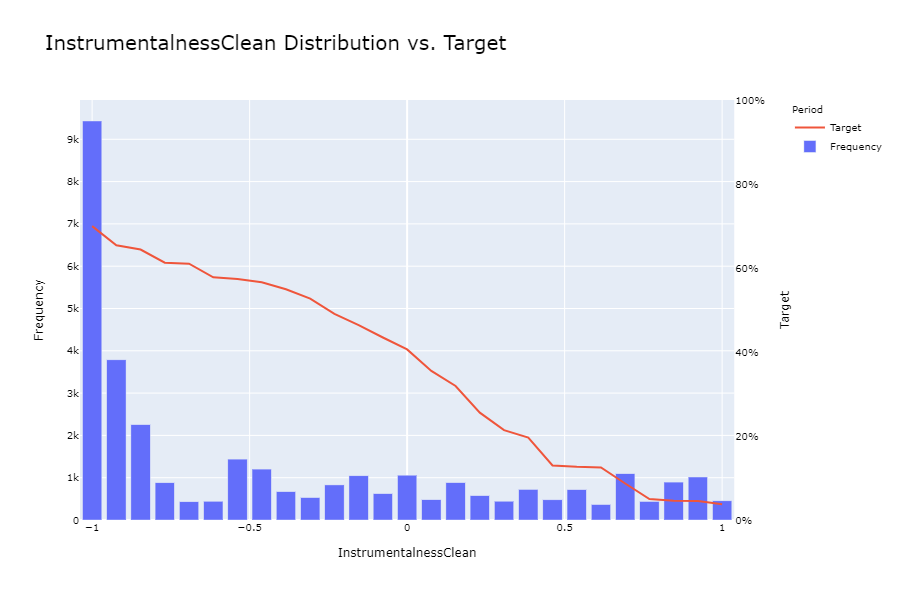

                     Target
DanceabilityClean          
-1.000000          0.019149
-0.933333          0.068132
-0.866667          0.096677
-0.800000          0.152299
-0.733333          0.192691
-0.666667          0.253896
-0.600000          0.292355
-0.533333          0.304556
-0.466667          0.316027
-0.400000          0.367665
-0.333333          0.389980
-0.266667          0.396450
-0.200000          0.434174
-0.133333          0.449021
-0.066667          0.467512
 0.000000          0.485788
 0.066667          0.510766
 0.133333          0.519038
 0.200000          0.569044
 0.266667          0.581484
 0.333333          0.591524
 0.400000          0.604494
 0.466667          0.619988
 0.533333          0.631489
 0.600000          0.633333
 0.666667          0.655756
 0.733333          0.680923
 0.800000          0.694458
 0.866667          0.701681
 0.933333          0.717895
 1.000000          0.796200
                   Target
DanceabilityClean        
-1.000000             47

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




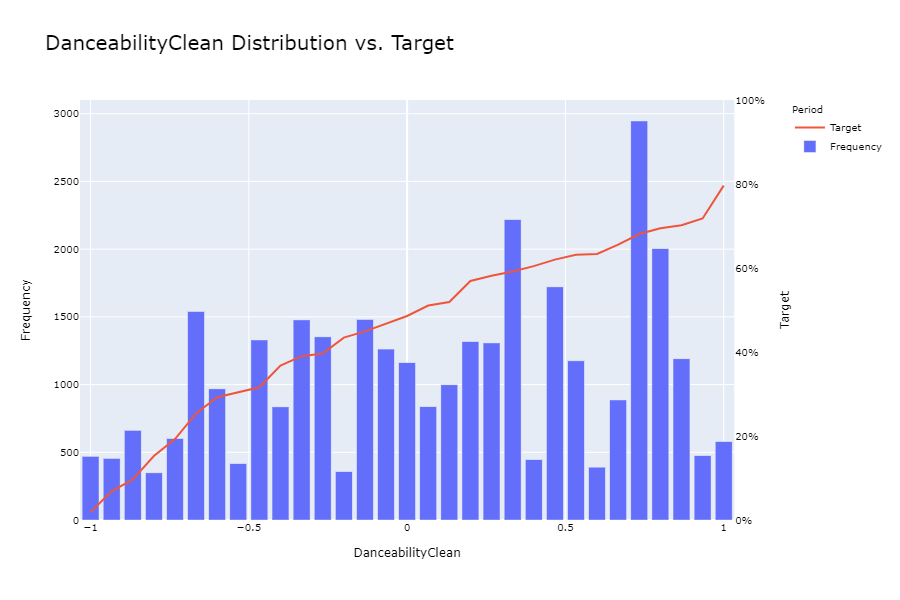

                 Target
LoudnessClean          
-1.000000      0.005208
-0.931034      0.045400
-0.862069      0.084016
-0.793103      0.129841
-0.724138      0.152239
-0.655172      0.221461
-0.586207      0.264175
-0.517241      0.328032
-0.448276      0.352818
-0.379310      0.409396
-0.310345      0.450148
-0.241379      0.477621
-0.172414      0.529412
-0.103448      0.532600
-0.034483      0.540791
 0.034483      0.568765
 0.103448      0.569006
 0.172414      0.570223
 0.241379      0.573571
 0.310345      0.577009
 0.379310      0.578397
 0.448276      0.600917
 0.517241      0.609787
 0.586207      0.649425
 0.655172      0.658754
 0.724138      0.618310
 0.793103      0.613046
 0.862069      0.611675
 0.931034      0.609521
 1.000000      0.488251
               Target
LoudnessClean        
-1.000000         576
-0.931034         837
-0.862069         488
-0.793103         439
-0.724138         335
-0.655172         438
-0.586207         776
-0.517241         503
-0.448276   

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




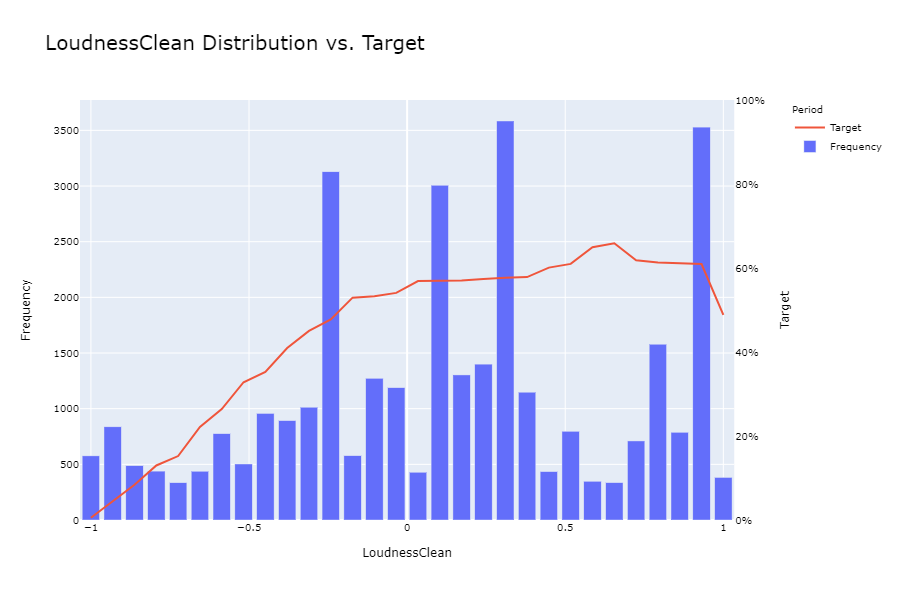

                    Target
Duration_MsClean          
-1.000000         0.007614
-0.941176         0.026385
-0.882353         0.093079
-0.823529         0.233533
-0.764706         0.360465
-0.705882         0.427053
-0.647059         0.491892
-0.588235         0.493238
-0.529412         0.494526
-0.470588         0.494973
-0.411765         0.517199
-0.352941         0.525152
-0.294118         0.577369
-0.235294         0.581699
-0.176471         0.614472
-0.117647         0.614551
-0.058824         0.618692
 0.000000         0.655087
 0.058824         0.687345
 0.117647         0.649783
 0.176471         0.628571
 0.235294         0.620991
 0.294118         0.589710
 0.352941         0.583965
 0.411765         0.578616
 0.470588         0.553062
 0.529412         0.526992
 0.588235         0.515152
 0.647059         0.444099
 0.705882         0.362989
 0.764706         0.307692
 0.823529         0.279891
 0.882353         0.212389
 0.941176         0.167048
 1.000000         0.057769
 

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




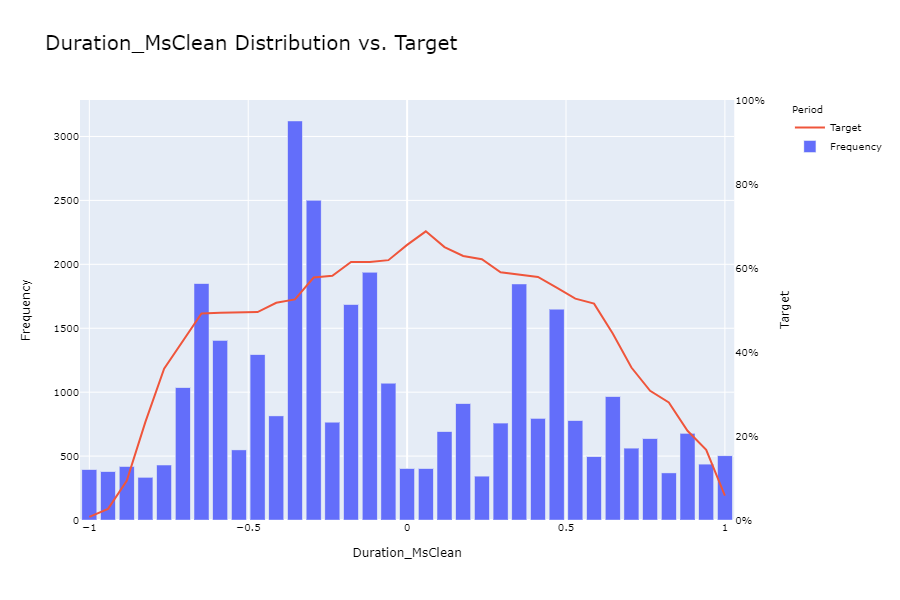

               Target
EnergyClean          
-1.000000    0.019704
-0.941176    0.032746
-0.882353    0.075597
-0.823529    0.142857
-0.764706    0.149123
-0.705882    0.197143
-0.647059    0.224181
-0.588235    0.267705
-0.529412    0.301587
-0.470588    0.373253
-0.411765    0.407375
-0.352941    0.477218
-0.294118    0.480653
-0.235294    0.481250
-0.176471    0.527319
-0.117647    0.549695
-0.058824    0.567130
 0.000000    0.603960
 0.058824    0.607677
 0.117647    0.610588
 0.176471    0.650396
 0.235294    0.650812
 0.294118    0.667367
 0.352941    0.674651
 0.411765    0.656475
 0.470588    0.597605
 0.529412    0.596531
 0.588235    0.554336
 0.647059    0.529032
 0.705882    0.468048
 0.764706    0.394161
 0.823529    0.331579
 0.882353    0.298153
 0.941176    0.208333
 1.000000    0.095652
             Target
EnergyClean        
-1.000000       406
-0.941176       397
-0.882353       754
-0.823529       364
-0.764706       342
-0.705882       350
-0.647059       397
-0.588

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




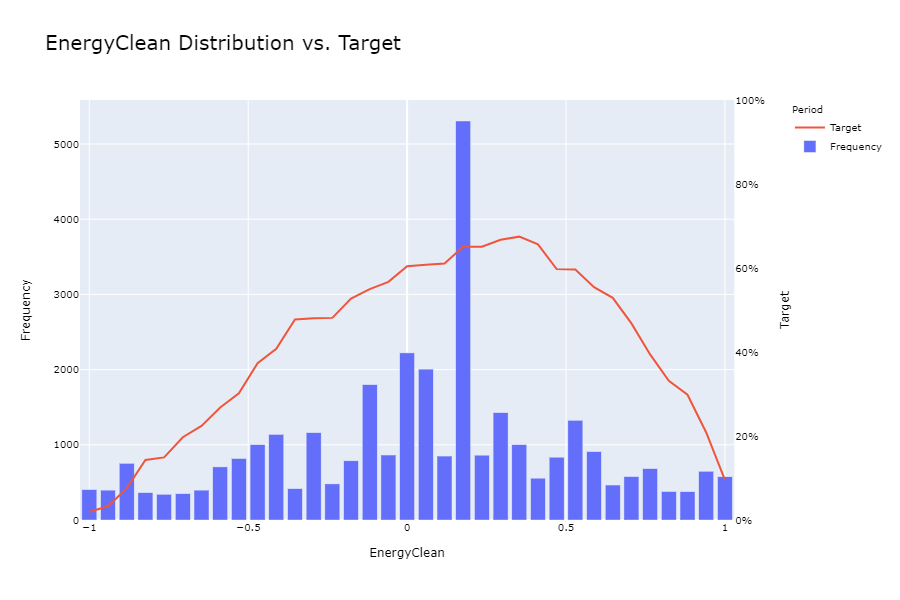

                     Target
AcousticnessClean          
-1.000000          0.014970
-0.947368          0.050360
-0.894737          0.148087
-0.842105          0.260526
-0.789474          0.302564
-0.736842          0.363924
-0.684211          0.484756
-0.631579          0.545635
-0.578947          0.554479
-0.526316          0.620321
-0.473684          0.649143
-0.421053          0.682705
-0.368421          0.697987
-0.315789          0.698398
-0.263158          0.698565
-0.210526          0.782998
-0.157895          0.735736
-0.105263          0.707692
-0.052632          0.702381
 0.000000          0.697150
 0.052632          0.679483
 0.105263          0.631240
 0.157895          0.614563
 0.210526          0.587657
 0.263158          0.538858
 0.315789          0.537815
 0.368421          0.499673
 0.421053          0.464744
 0.473684          0.459072
 0.526316          0.387077
 0.578947          0.369565
 0.631579          0.275907
 0.684211          0.256798
 0.736842          0

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




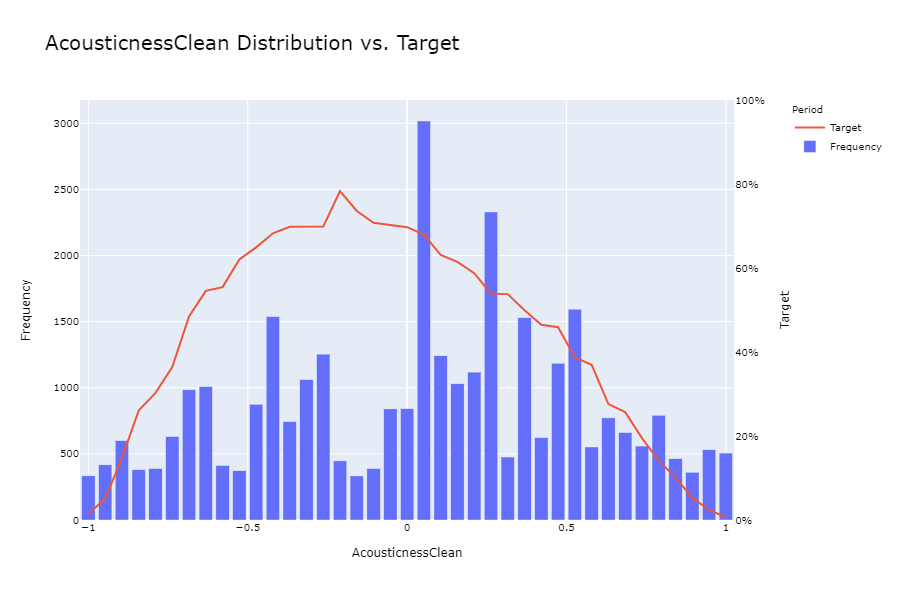

              Target
TempoClean          
-1.000000   0.204420
-0.904762   0.317276
-0.809524   0.446640
-0.714286   0.463132
-0.619048   0.491422
-0.523810   0.498925
-0.428571   0.500309
-0.333333   0.508813
-0.238095   0.530929
-0.142857   0.539548
-0.047619   0.558051
 0.047619   0.559883
 0.142857   0.590433
 0.238095   0.632047
 0.333333   0.567039
 0.428571   0.513043
 0.523810   0.511222
 0.619048   0.505420
 0.714286   0.496356
 0.809524   0.473684
 0.904762   0.470801
 1.000000   0.453538
            Target
TempoClean        
-1.000000      362
-0.904762      602
-0.809524     3289
-0.714286     1641
-0.619048      816
-0.523810      930
-0.428571     1617
-0.333333     2156
-0.238095     5157
-0.142857      354
-0.047619     2627
 0.047619     1027
 0.142857      669
 0.238095      337
 0.333333      358
 0.428571     3450
 0.523810      802
 0.619048     1476
 0.714286     1372
 0.809524      779
 0.904762     2209
 1.000000     1173


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




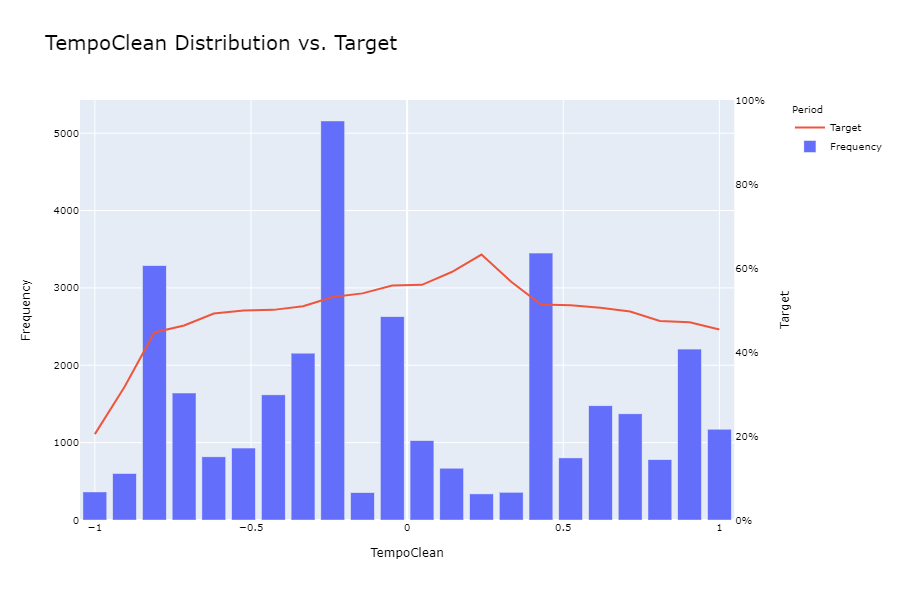

                 Target
SectionsClean          
-1.000000      0.048101
-0.882353      0.121905
-0.764706      0.270974
-0.647059      0.420141
-0.529412      0.492532
-0.411765      0.537332
-0.294118      0.575128
-0.176471      0.586635
-0.058824      0.587179
 0.058824      0.564767
 0.176471      0.539315
 0.294118      0.512212
 0.411765      0.465336
 0.529412      0.430285
 0.647059      0.329341
 0.764706      0.276243
 0.882353      0.171598
 1.000000      0.049900
               Target
SectionsClean        
-1.000000         395
-0.882353         525
-0.764706        1037
-0.647059        1847
-0.529412        3013
-0.411765        3951
-0.294118        4479
-0.176471        4265
-0.058824        3619
 0.058824        2895
 0.176471        2073
 0.294118        1433
 0.411765         952
 0.529412         667
 0.647059         501
 0.764706         543
 0.882353         507
 1.000000         501


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




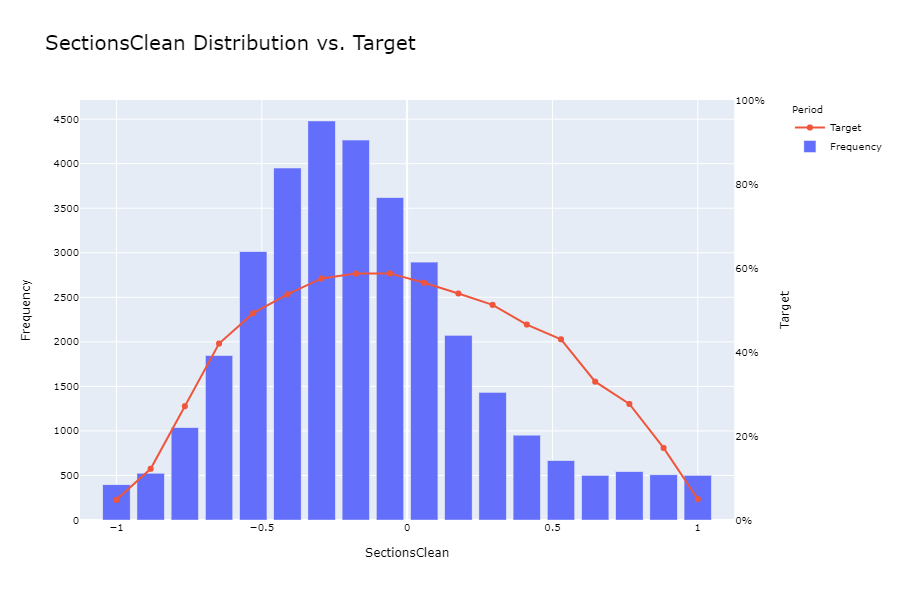

                   Target
Chorus_HitClean          
-1.000           0.098802
-0.875           0.434164
-0.750           0.505076
-0.625           0.520917
-0.500           0.522461
-0.375           0.531205
-0.250           0.603399
-0.125           0.525570
 0.000           0.511166
 0.125           0.506494
 0.250           0.504232
 0.375           0.498340
 0.500           0.485632
 0.625           0.461182
 0.750           0.417021
 0.875           0.404130
 1.000           0.357022
                 Target
Chorus_HitClean        
-1.000              334
-0.875              562
-0.750              394
-0.625             2749
-0.500             3673
-0.375              689
-0.250              353
-0.125            10227
 0.000             1209
 0.125              693
 0.250             2481
 0.375             4519
 0.500              348
 0.625             3233
 0.750              470
 0.875              678
 1.000              591


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




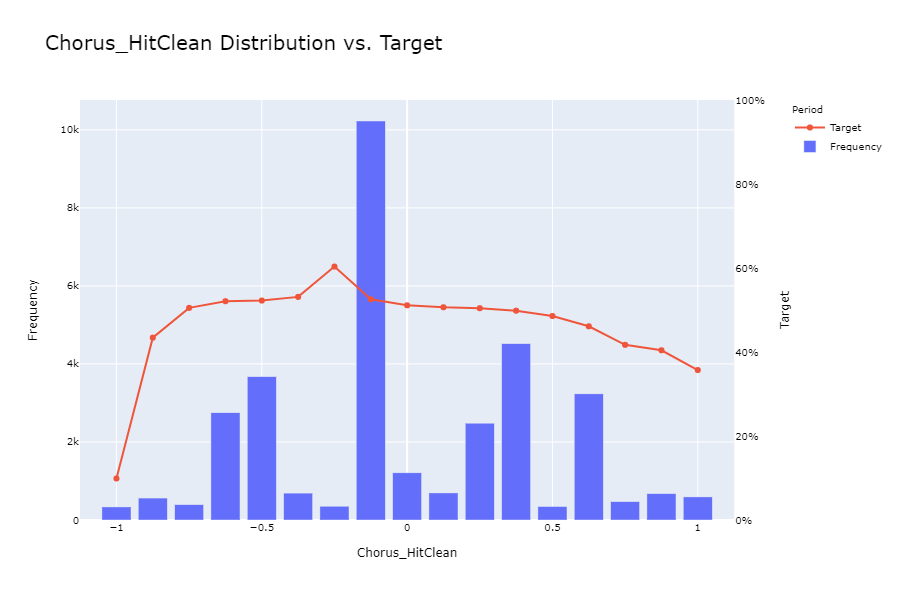

                Target
ValenceClean          
-1.000000     0.009317
-0.909091     0.044619
-0.818182     0.088388
-0.727273     0.149457
-0.636364     0.244565
-0.545455     0.270872
-0.454545     0.335309
-0.363636     0.380228
-0.272727     0.388889
-0.181818     0.425036
-0.090909     0.445934
 0.000000     0.477362
 0.090909     0.480663
 0.181818     0.494766
 0.272727     0.525478
 0.363636     0.525806
 0.454545     0.542648
 0.545455     0.552301
 0.636364     0.574882
 0.727273     0.585408
 0.818182     0.599265
 0.909091     0.611365
 1.000000     0.621941
              Target
ValenceClean        
-1.000000        644
-0.909091        381
-0.818182        577
-0.727273        368
-0.636364        736
-0.545455        539
-0.454545       1181
-0.363636        789
-0.272727        378
-0.181818        687
-0.090909       2238
 0.000000       2805
 0.090909        362
 0.181818       1433
 0.272727       1256
 0.363636       1240
 0.454545       1231
 0.545455        956
 0.63

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




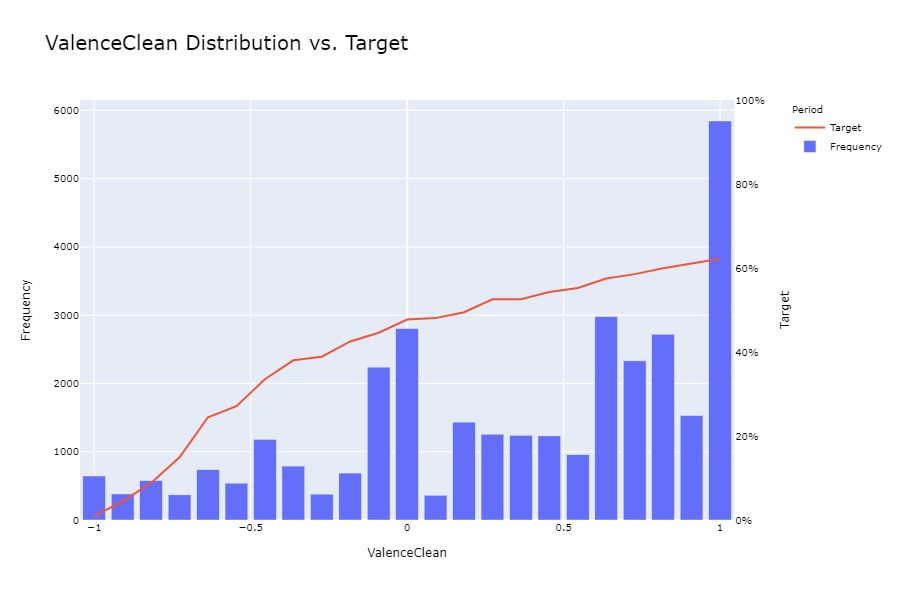

             Target
KeyClean           
-1.000000  0.552239
-0.818182  0.550541
-0.636364  0.547095
-0.454545  0.523238
-0.272727  0.510240
-0.090909  0.502056
 0.090909  0.490634
 0.272727  0.488800
 0.454545  0.479022
 0.636364  0.473723
 0.818182  0.466198
 1.000000  0.456750
           Target
KeyClean         
-1.000000    2211
-0.818182    2681
-0.636364    1773
-0.454545    1915
-0.272727    2295
-0.090909    4135
 0.090909    3043
 0.272727    4018
 0.454545    3599
 0.636364    2683
 0.818182    1139
 1.000000    3711


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




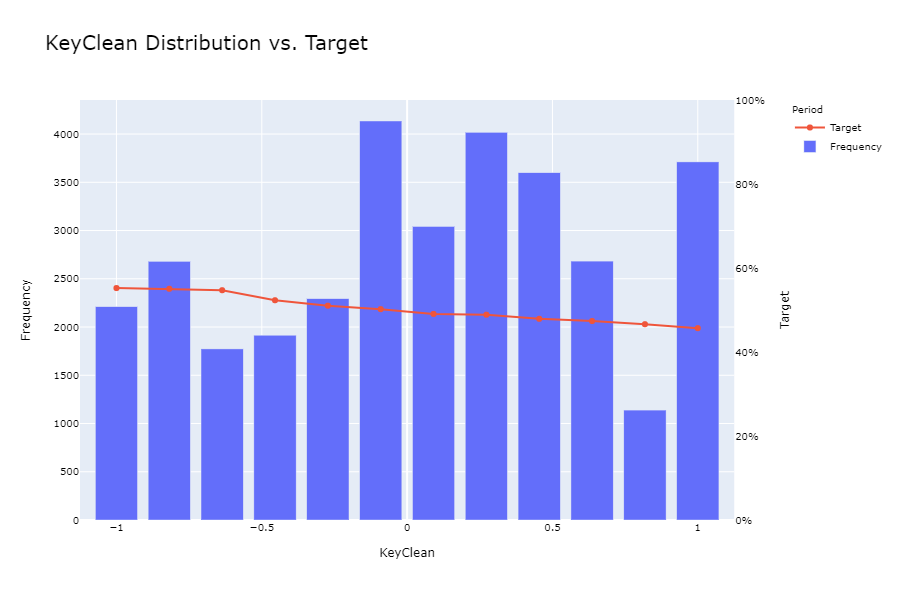

                        Target
LoudnessSquaredClean          
-1.000000             0.005208
-0.997622             0.045400
-0.990488             0.084016
-0.978597             0.129841
-0.961950             0.152239
-0.940547             0.221461
-0.914388             0.264175
-0.883472             0.328032
-0.847800             0.352818
-0.807372             0.409396
-0.762188             0.450148
-0.712247             0.477621
-0.657551             0.529412
-0.598098             0.532600
-0.533888             0.540791
-0.464923             0.568765
-0.391201             0.569006
-0.312723             0.570223
-0.229489             0.573571
-0.141498             0.577009
-0.048751             0.578397
 0.048751             0.600917
 0.151011             0.609787
 0.258026             0.649425
 0.369798             0.658754
 0.486326             0.618310
 0.607610             0.613046
 0.733650             0.611675
 0.864447             0.609521
 1.000000             0.488251
        

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




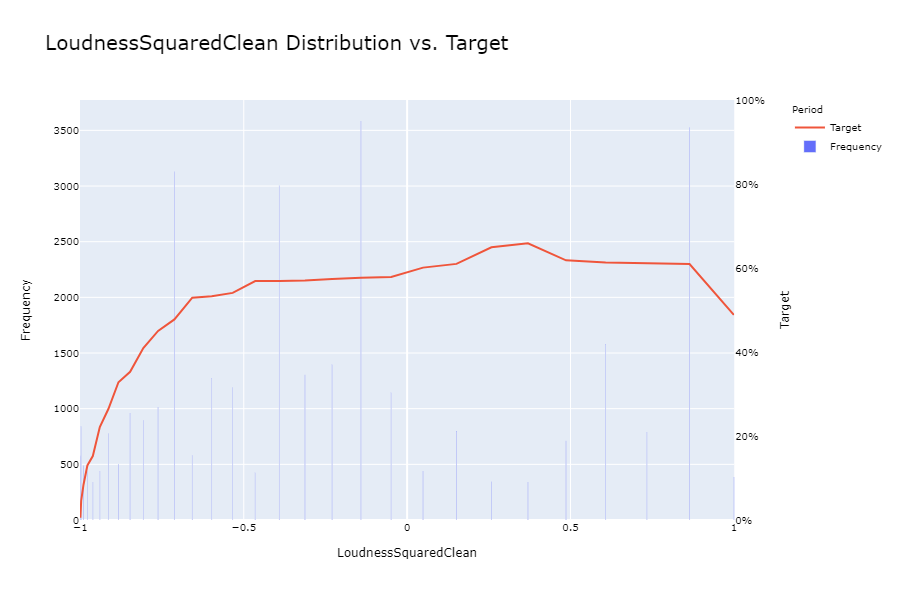

                           Target
Duration_MsSquaredClean          
-1.000000                0.007614
-0.998270                0.026385
-0.993080                0.093079
-0.984429                0.233533
-0.972318                0.360465
-0.956747                0.427053
-0.937716                0.491892
-0.915225                0.493238
-0.889273                0.494526
-0.859862                0.494973
-0.826990                0.517199
-0.790657                0.525152
-0.750865                0.577369
-0.707612                0.581699
-0.660900                0.614472
-0.610727                0.614551
-0.557093                0.618692
-0.500000                0.655087
-0.439446                0.687345
-0.375433                0.649783
-0.307958                0.628571
-0.237024                0.620991
-0.162630                0.589710
-0.084775                0.583965
-0.003460                0.578616
 0.081315                0.553062
 0.169550                0.526992
 0.261246     

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




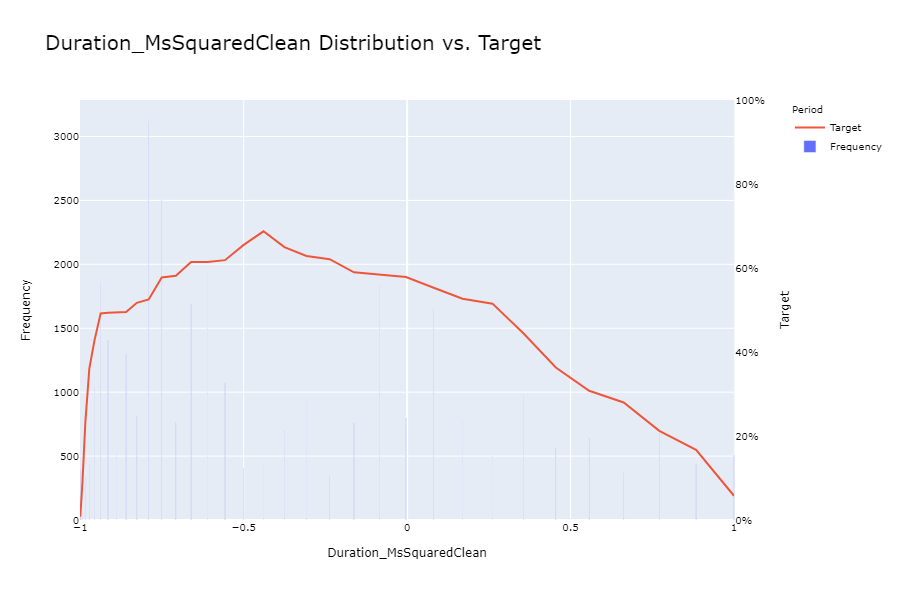

                      Target
EnergySquaredClean          
-1.000000           0.019704
-0.998270           0.032746
-0.993080           0.075597
-0.984429           0.142857
-0.972318           0.149123
-0.956747           0.197143
-0.937716           0.224181
-0.915225           0.267705
-0.889273           0.301587
-0.859862           0.373253
-0.826990           0.407375
-0.790657           0.477218
-0.750865           0.480653
-0.707612           0.481250
-0.660900           0.527319
-0.610727           0.549695
-0.557093           0.567130
-0.500000           0.603960
-0.439446           0.607677
-0.375433           0.610588
-0.307958           0.650396
-0.237024           0.650812
-0.162630           0.667367
-0.084775           0.674651
-0.003460           0.656475
 0.081315           0.597605
 0.169550           0.596531
 0.261246           0.554336
 0.356401           0.529032
 0.455017           0.468048
 0.557093           0.394161
 0.662630           0.331579
 0.771626     

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




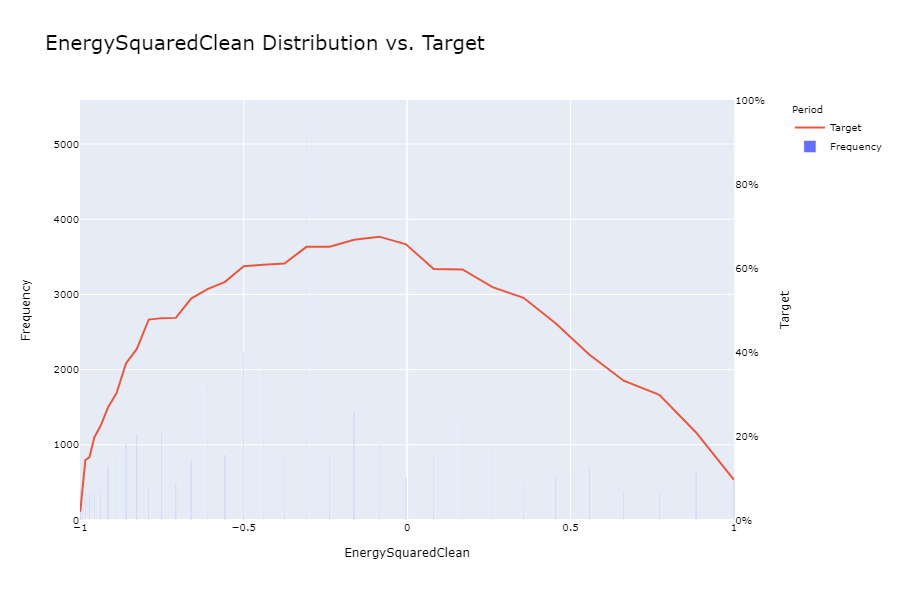

                            Target
AcousticnessSquaredClean          
-1.000000                 0.014970
-0.998615                 0.050360
-0.994460                 0.148087
-0.987535                 0.260526
-0.977839                 0.302564
-0.965374                 0.363924
-0.950139                 0.484756
-0.932133                 0.545635
-0.911357                 0.554479
-0.887812                 0.620321
-0.861496                 0.649143
-0.832410                 0.682705
-0.800554                 0.697987
-0.765928                 0.698398
-0.728532                 0.698565
-0.688366                 0.782998
-0.645429                 0.735736
-0.599723                 0.707692
-0.551247                 0.702381
-0.500000                 0.697150
-0.445983                 0.679483
-0.389197                 0.631240
-0.329640                 0.614563
-0.267313                 0.587657
-0.202216                 0.538858
-0.134349                 0.537815
-0.063712           

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




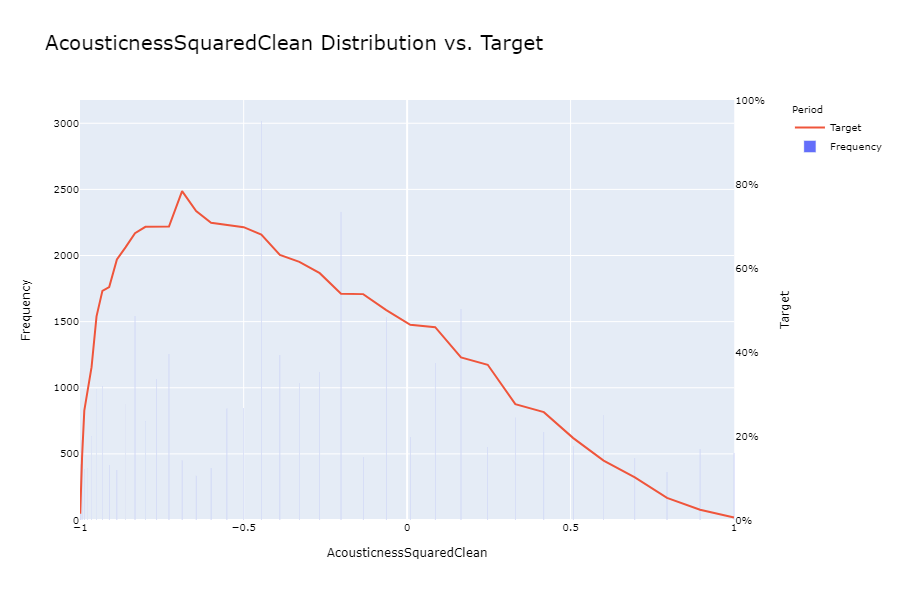

                     Target
TempoSquaredClean          
-1.000000          0.204420
-0.995465          0.317276
-0.981859          0.446640
-0.959184          0.463132
-0.927438          0.491422
-0.886621          0.498925
-0.836735          0.500309
-0.777778          0.508813
-0.709751          0.530929
-0.632653          0.539548
-0.546485          0.558051
-0.451247          0.559883
-0.346939          0.590433
-0.233560          0.632047
-0.111111          0.567039
 0.020408          0.513043
 0.160998          0.511222
 0.310658          0.505420
 0.469388          0.496356
 0.637188          0.473684
 0.814059          0.470801
 1.000000          0.453538
                   Target
TempoSquaredClean        
-1.000000             362
-0.995465             602
-0.981859            3289
-0.959184            1641
-0.927438             816
-0.886621             930
-0.836735            1617
-0.777778            2156
-0.709751            5157
-0.632653             354
-0.546485       

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




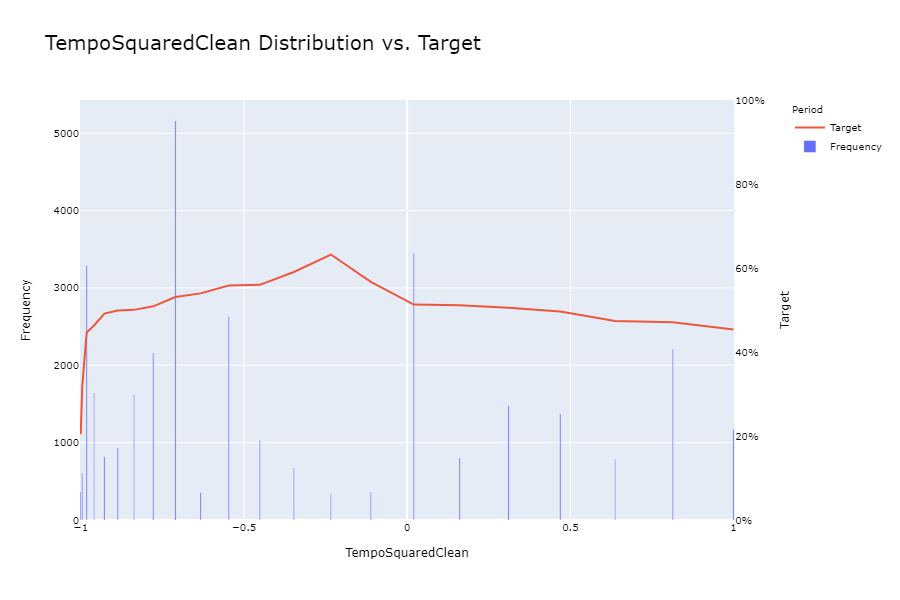

                        Target
SectionsSquaredClean          
-1.000000             0.048101
-0.993080             0.121905
-0.972318             0.270974
-0.937716             0.420141
-0.889273             0.492532
-0.826990             0.537332
-0.750865             0.575128
-0.660900             0.586635
-0.557093             0.587179
-0.439446             0.564767
-0.307958             0.539315
-0.162630             0.512212
-0.003460             0.465336
 0.169550             0.430285
 0.356401             0.329341
 0.557093             0.276243
 0.771626             0.171598
 1.000000             0.049900
                      Target
SectionsSquaredClean        
-1.000000                395
-0.993080                525
-0.972318               1037
-0.937716               1847
-0.889273               3013
-0.826990               3951
-0.750865               4479
-0.660900               4265
-0.557093               3619
-0.439446               2895
-0.307958               2073
-0.

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




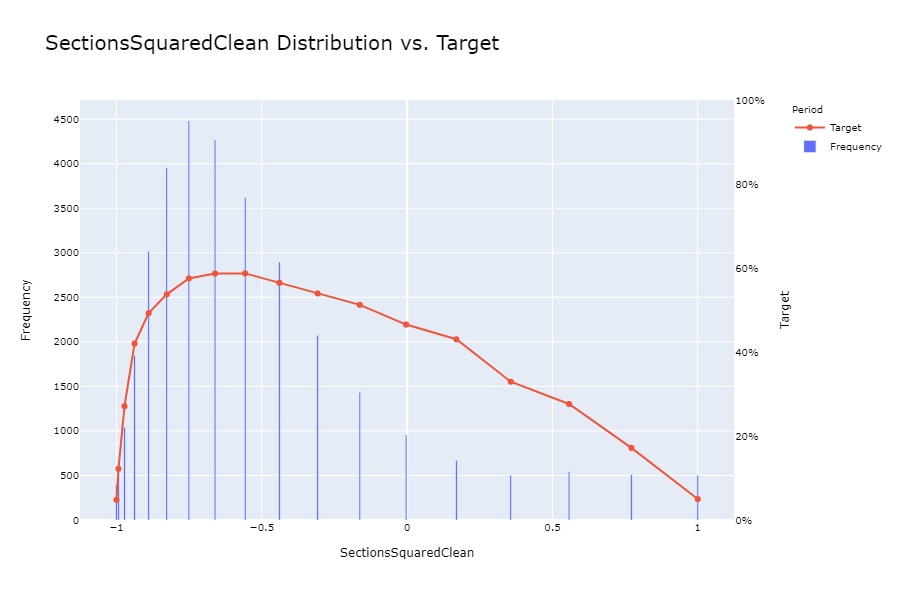

                          Target
Chorus_HitSquaredClean          
-1.000000               0.098802
-0.992188               0.434164
-0.968750               0.505076
-0.929688               0.520917
-0.875000               0.522461
-0.804688               0.531205
-0.718750               0.603399
-0.617188               0.525570
-0.500000               0.511166
-0.367188               0.506494
-0.218750               0.504232
-0.054688               0.498340
 0.125000               0.485632
 0.320312               0.461182
 0.531250               0.417021
 0.757812               0.404130
 1.000000               0.357022
                        Target
Chorus_HitSquaredClean        
-1.000000                  334
-0.992188                  562
-0.968750                  394
-0.929688                 2749
-0.875000                 3673
-0.804688                  689
-0.718750                  353
-0.617188                10227
-0.500000                 1209
-0.367188                  693
-

C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




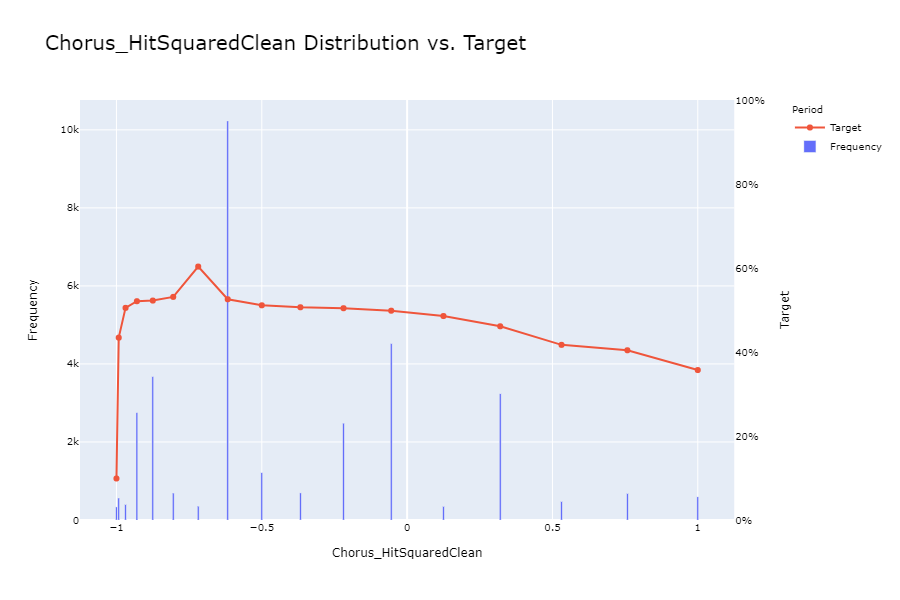

                    Target
ValenceSqrtClean          
-1.000000         0.009317
-0.573599         0.044619
-0.396977         0.088388
-0.261451         0.149457
-0.147197         0.244565
-0.046537         0.270872
 0.044466         0.335309
 0.128152         0.380228
 0.206045         0.388889
 0.279204         0.425036
 0.348400         0.445934
 0.414214         0.477362
 0.477098         0.480663
 0.537412         0.494766
 0.595448         0.525478
 0.651446         0.525806
 0.705606         0.542648
 0.758098         0.552301
 0.809068         0.574882
 0.858641         0.585408
 0.906925         0.599265
 0.954017         0.611365
 1.000000         0.621941
                  Target
ValenceSqrtClean        
-1.000000            644
-0.573599            381
-0.396977            577
-0.261451            368
-0.147197            736
-0.046537            539
 0.044466           1181
 0.128152            789
 0.206045            378
 0.279204            687
 0.348400           2238


C:\Users\tom.dawson\AppData\Local\Continuum\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




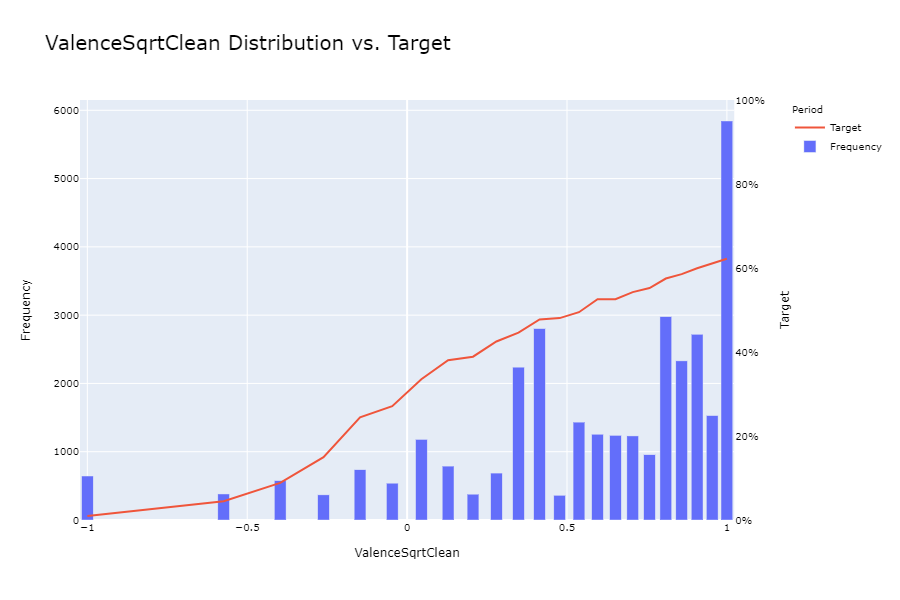

In [27]:
for Variable in ModVarsClean:
    Scaler = MinMaxScaler(feature_range=(-1, 1))
    Scaler = Scaler.fit(Train[Variable].values.reshape(-1, 1))
    Train[Variable] = Scaler.transform(Train[Variable].values.reshape(-1, 1))
    Test[Variable] = Scaler.transform(Test[Variable].values.reshape(-1, 1))
    
    BinPlot(Train, Variable, "Target")

## Variable Correlations

In [28]:
Correlation(Train, sorted(ModVarsClean)+["Target"], "CorrelationPlot")

In [36]:
OverFit = []
for i in Train.columns:
    Counts = Train[i].value_counts()
    Zeros = Counts.iloc[0]
    if Zeros / len(Train) * 100 > 99.94:
        OverFit.append(i)
        print(Counts)

OverFit = list(OverFit)
print(OverFit)
#X_train = X_train.drop(overfit, axis=1)
#print(X_train.shape)

Train    33203
Name: Population, dtype: int64
['Population']


## Modelling

In [29]:
X = ['AcousticClean', 'DanceabilityClean', 'Duration_MsClean', 'Duration_MsSquaredClean'
                , 'EnergyClean', 'EnergySquaredClean', 'FourFourClean', 'InstrumentalnessClean', 'KeyClean'
                , 'LivenessClean', 'LoudnessClean', 'LoudnessSquaredClean', 'LowEnergyClean', 'ModeClean'
                , 'SectionsClean', 'SectionsSquaredClean', 'ValenceClean', 'ValenceSqrtClean']

Y = "Target"

In [30]:
Mod = LogisticRegression(penalty='l1', solver='liblinear', fit_intercept=True)
Mod = Mod.fit(Train[X], Train[Y])
TrainPreds = Mod.predict(Train[X])
Mod.score(Train[X], Train[Y])

0.7510767099358492

In [91]:
FeatureImportance = {}
for i in range(len(X)):
    FeatureImportance[X[i]] = np.abs(Mod.coef_[0][i])
FeatureImportance = pd.DataFrame(FeatureImportance, index=[1,])
FeatureImportance = FeatureImportance.T.sort_values(by=1).T

In [92]:
confusion_matrix(TrainPreds, Train[Y])

array([[11519,  3175],
       [ 5090, 13419]], dtype=int64)

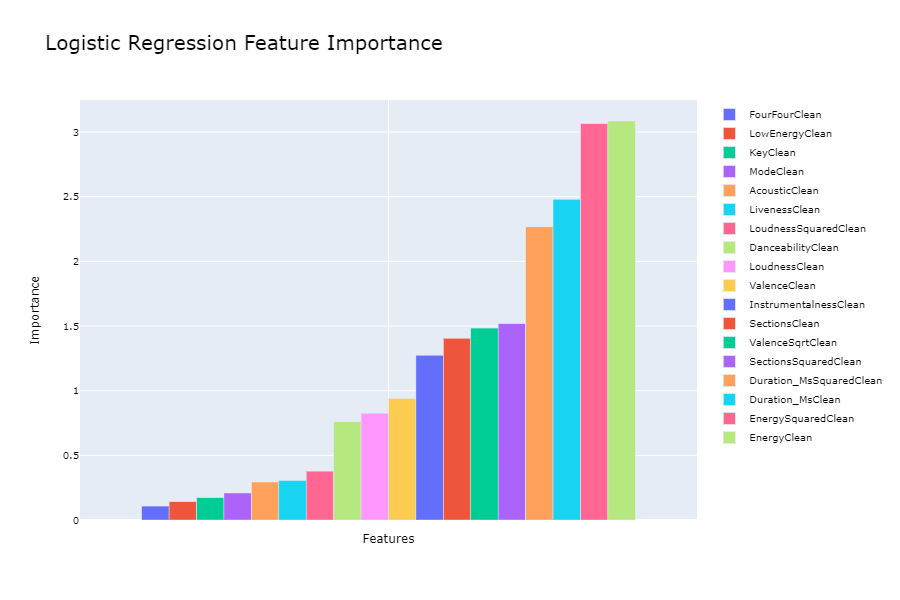

In [99]:
BarPlot(FeatureImportance, "Logistic Regression Feature Importance")